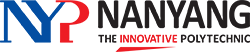

# IT3311 Assignment - Task 2: Image Classification

You are required to build an image classification model to predict the video category based its thumbnail. This analysis aims to be accompaniment to the results of the text classification and the possibilities of using the image classification results together for video category classification.

**Tasks:**

1. **Data Understanding**: Examine the dataset
2. **Data Preparation**: Prepares the data and all necessary preprocessing tasks
3. **Modelling**: Use different text representation and algorithms
4. **Evaluation**: Evaluates results from the algorithms and select the best model

<h2 style="background-color:#FA8072;border-radius:5px;text-align:center;padding:15px;color:white;">Project Name: Image Classification of Video Categories</h2>
<h3>Done by: TEY JIA YING (202704D)<br><br>Module Code: IT3311-01</h3>

<h1 style="background-color:#FA8072;border-radius:5px;text-align:center;padding:7px;color:white;"><font color="white">Overview of Project</h1>

<h3>Overview:</h3>
I have structured the project into 5 key sections. Below, I will share with you the steps I took together with insights for each section.<br>

1. [Basic Data Preprocessing](#1)<br>
    1.1 [Referential Dataframe for linking filename to Channel & Category](#11)<br>
    1.2 [Creating a Image Dataframe for storing Image Pixels and Video Category](#12)<br>
    1.3 [Merging of both dataframe](#13)<br><br>
2. [Data Understanding & Exploratory Data Analysis](#2)<br>
    2.1 [Basic Data Understanding](#21)<br>
    2.2 [Deeper Data Understanding](#22)<br>
    2.2.1 [Video Category Understanding and Analysis](#221)<br>
    2.2.2 [Thumbnail Image Understanding and Analysis](#222)<br>
<br>
3. [Data Preparation](#3)<br>
    3.1 [Justification & Documentation of Data Preparation Steps](#31)<br>
    3.2 [Final Data preparation steps [Justified in 3.1]](#32)<br>
 <br>   
4. [Modelling](#4)<br>
    4.1. [Model 1: Random Forest Classifier](#41)<br>
    4.2. [Model 2: Logistic Regression](#42)<br>
    4.3. [Model 3: Multinomial Naives Bayes](#43)<br>
    4.4. [Model 4: Support Vector Machine](#44)<br>
5. [Comparison of models](#5)
<br><br>
6. [Comparison of predicion from task 1& task2 ](#6)
<br><br>
7. [Conclusion ](#7)
**<b>Note: Click on the links to go to the respective section</b>**


<a id='1'><h1 style="background-color:#FA8072;border-radius:5px;text-align:center;padding:7px;color:white;"><font color="white">Import libraries and download the packages</h1>

In [4]:
import pandas as pd
import os
from tqdm import tqdm
#from keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns # for plotting.
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
# import NN layers and other componene
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv2D, Dense, Flatten, Dropout
from tensorflow.keras.layers import GlobalMaxPooling2D, MaxPooling2D,MaxPool2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers, optimizers
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from skimage.io import imread, imshow
from skimage.transform import resize
from skimage.feature import hog
from skimage import exposure
from keras.applications.vgg16 import VGG16 
from keras.preprocessing import image 
import numpy as np 
from sklearn.metrics import accuracy_score
import cv2
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.multioutput import MultiOutputClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_validate
# Baseline logistic regression
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img
from sklearn.multioutput import MultiOutputClassifier
import warnings
from keras.preprocessing.image import load_img, img_to_array
from matplotlib import image
from tensorflow.keras.utils import load_img
# importing required libraries
from skimage.io import imread, imshow
from skimage.transform import resize
from skimage.feature import hog
from skimage import exposure
warnings.filterwarnings("ignore")
from keras.applications.vgg16 import VGG16 
from keras.preprocessing import image 
import numpy as np 
from tensorflow.keras.applications.resnet50 import preprocess_input 

<a id='1'><h1 style="background-color:#FA8072;border-radius:5px;text-align:center;padding:7px;color:white;"><font color="white">1. Basic Preprocessing</h1>

<b>In this section I will be creating 2 dataframes: </b><br>
1.1 [Referential Dataframe for linking filename to Channel & Category](#11)<br>
1.2 [Creating a Image Dataframe for storing Image Pixels and Video Category](#12)<br>
1.3 [Merging of both dataframe](#13)

<a id="11"><h2>1.1 Creating a Referential Dataframe for linking filename to Channel & Category</h2></a>

## 1.1.1 Creating filename and channel column

In [135]:
df=pd.DataFrame()
df['Filename']=""
df['Channel']=""
#df['VideoCategory']=''
Channel_List=os.listdir('./data/images')

Category_Channel_Dict={"Comedy":["Brooklyn Nine-Nine", "DRIVETRIBE", "Incognito Mode", "Internet Historian", "Joma Tech", "Key & Peele", "OverSimplified", "Parks and Recreation", "penguinz0", "Screen Junkies", "Team Coco", "The Graham Norton Show", "The Grand Tour", "The Office", "Top Gear"],
 "VideoGames":["3Blue1Brown","Dr. Becky","ElectroBOOM","Kurzgesagt In a Nutshell","Lex Clips","Mark Rober","NileRed","PBS Space Time","SEA","SmarterEveryDay","Veritasium","Vsauce"],
 "Food":["About To Eat","Bon Appetit","Eater","Epicurious","First We Feast","FoodTribe","Gordon Ramsay","Hell's Kitchen","Munchies","Mythical Kitchen","The F Word"],
"Entertainment":["Brooklyn Nine-Nine","BuzzFeedVideo","Doctor Who","First We Feast","MrBeast","Parks and Recreation","Screen Junkies","Team Coco","The Graham Norton Show","The Office","The Try Guys"],
"News":["A&E","BBC News","Insider News","NBC News","NowThis News","Sky News","SomeGoodNews","TechLinked","The Daily Show with Trevor Noah","VICE"],
"Tech":["Austin Evans","Coder Coder","Fireship","Hardware Canucks","Joma Tech","Linus Tech Tips","Marques Brownlee","TechLinked","Techquickie","Web Dev Simplified"]}



for i in range(len(Channel_List)):
    filename_list=os.listdir('./data/images/'+Channel_List[i])
    df_temp=pd.DataFrame({"Filename":filename_list})
    df_temp['Channel']=Channel_List[i]
    df=pd.concat([df,df_temp])
def remove_jpg(i):
    return i[:-4]
df['Filename']=df['Filename'].apply(remove_jpg)

df=df.reset_index().drop(columns=['index'])
df

,Filename,Channel
0,3d6DsjIBzJ4,3Blue1Brown
1,aircAruvnKk,3Blue1Brown
2,bBC-nXj3Ng4,3Blue1Brown
3,CfW845LNObM,3Blue1Brown
4,d-o3eB9sfls,3Blue1Brown
...,...,...
1514,p3qvj9hO_Bo,Web Dev Simplified
1515,R8rmfD9Y5-c,Web Dev Simplified
1516,V_Kr9OSfDeU,Web Dev Simplified
1517,y17RuWkWdn8,Web Dev Simplified


## 1.1.2 Creating video category column for each category

In [136]:
##CREATING VIDEO CATEGORY COLUMN
df['VideoCategory']=''
for i in range(len(df)):
    df['VideoCategory'][i]=[]
VideoCategory=list(Category_Channel_Dict.keys())
for i in range(len(df)):
    for j in range(len(VideoCategory)):
        if df['Channel'][i] in Category_Channel_Dict[VideoCategory[j]]:
            df['VideoCategory'][i].append(VideoCategory[j])
df

,Filename,Channel,VideoCategory
0,3d6DsjIBzJ4,3Blue1Brown,[VideoGames]
1,aircAruvnKk,3Blue1Brown,[VideoGames]
2,bBC-nXj3Ng4,3Blue1Brown,[VideoGames]
3,CfW845LNObM,3Blue1Brown,[VideoGames]
4,d-o3eB9sfls,3Blue1Brown,[VideoGames]
...,...,...,...
1514,p3qvj9hO_Bo,Web Dev Simplified,[Tech]
1515,R8rmfD9Y5-c,Web Dev Simplified,[Tech]
1516,V_Kr9OSfDeU,Web Dev Simplified,[Tech]
1517,y17RuWkWdn8,Web Dev Simplified,[Tech]



### 1.1.3 Creating multiple column for each category

In [137]:
df['Category_Food']=0
df['Category_Tech']=0
df['Category_Entertainment']=0
df['Category_Comedy']=0
df['Category_News']=0
df['Category_VideoGames']=0


for i in range(len(df)):
    for j in range(len(df['VideoCategory'][i])):
        if df['VideoCategory'][i][j]=='Food':
            df['Category_Food'][i]+=1
        elif df['VideoCategory'][i][j]=='Tech':
            df['Category_Tech'][i]+=1
        elif df['VideoCategory'][i][j]=='News':
            df['Category_News'][i]+=1
        elif df['VideoCategory'][i][j]=='Entertainment':
            df['Category_Entertainment'][i]+=1
        elif df['VideoCategory'][i][j]=='VideoGames':
            df['Category_VideoGames'][i]+=1
        elif df['VideoCategory'][i][j]=='Comedy':
            df['Category_Comedy'][i]+=1
df

,Filename,Channel,VideoCategory,Category_Food,Category_Tech,Category_Entertainment,Category_Comedy,Category_News,Category_VideoGames
0,3d6DsjIBzJ4,3Blue1Brown,[VideoGames],0,0,0,0,0,1
1,aircAruvnKk,3Blue1Brown,[VideoGames],0,0,0,0,0,1
2,bBC-nXj3Ng4,3Blue1Brown,[VideoGames],0,0,0,0,0,1
3,CfW845LNObM,3Blue1Brown,[VideoGames],0,0,0,0,0,1
4,d-o3eB9sfls,3Blue1Brown,[VideoGames],0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...
1514,p3qvj9hO_Bo,Web Dev Simplified,[Tech],0,1,0,0,0,0
1515,R8rmfD9Y5-c,Web Dev Simplified,[Tech],0,1,0,0,0,0
1516,V_Kr9OSfDeU,Web Dev Simplified,[Tech],0,1,0,0,0,0
1517,y17RuWkWdn8,Web Dev Simplified,[Tech],0,1,0,0,0,0


<a id="12"><h2>1.2 Creating a Image Dataframe for storing Image Pixels and Video Category</h2></a>

In [185]:
X_dataset=[]
image_directory="data/images/"
for i in tqdm(range(df.shape[0])):
    img=np.array(tf.keras.utils.load_img(image_directory+str(df['Channel'][i])+"/"+str(df['Filename'][i])+".jpg"))
    img=cv2.resize(img,(200,200))
    X_dataset.append(img)
X=np.array(X_dataset)

100%|█████████████████████████████████████████████████████████████████████████████| 1519/1519 [00:09<00:00, 157.06it/s]


In [187]:
image_df1=pd.DataFrame(X.reshape(1519,120000))

In [7]:
X_dataset=[]
image_directory="data/images/"
for i in tqdm(range(df.shape[0])):
    img=np.array(tf.keras.utils.load_img(image_directory+str(df['Channel'][i])+"/"+str(df['Filename'][i])+".jpg"))
    img=cv2.resize(img,(256,256))
    X_dataset.append(img)
X=np.array(X_dataset)

100%|██████████████████████████████████████████████████████████████████████████████| 1519/1519 [00:30<00:00, 50.20it/s]


In [9]:
X.shape

(1519, 256, 256, 3)

In [10]:
image_df=pd.DataFrame(X.reshape(1519,196608))

<a id="13"><h2>1.3 Merging of both dataframe</h2></a>

In [2]:
categories=['Category_Food','Category_Tech', 'Category_Entertainment', 'Category_Comedy',
          'Category_News', 'Category_VideoGames']


In [11]:
categories=['Category_Food','Category_Tech', 'Category_Entertainment', 'Category_Comedy',
          'Category_News', 'Category_VideoGames']

image_df[['Filename', 'Channel', 'VideoCategory', 'Category_Food','Category_Tech', 'Category_Entertainment', 'Category_Comedy',
          'Category_News', 'Category_VideoGames']]=df
image_df['Number of Tags']=image_df[categories].sum(axis=1)

In [12]:
image_df

,0,1,2,3,4,5,6,7,8,9,...,Filename,Channel,VideoCategory,Category_Food,Category_Tech,Category_Entertainment,Category_Comedy,Category_News,Category_VideoGames,Number of Tags
0,0,0,0,0,0,0,0,0,0,0,...,3d6DsjIBzJ4,3Blue1Brown,[VideoGames],0,0,0,0,0,1,1
1,0,0,0,0,0,0,0,0,0,0,...,aircAruvnKk,3Blue1Brown,[VideoGames],0,0,0,0,0,1,1
2,0,0,0,0,0,0,0,0,0,0,...,bBC-nXj3Ng4,3Blue1Brown,[VideoGames],0,0,0,0,0,1,1
3,0,0,0,0,0,0,0,0,0,0,...,CfW845LNObM,3Blue1Brown,[VideoGames],0,0,0,0,0,1,1
4,0,0,0,0,0,0,0,0,0,0,...,d-o3eB9sfls,3Blue1Brown,[VideoGames],0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1514,20,36,62,20,36,62,17,33,59,18,...,p3qvj9hO_Bo,Web Dev Simplified,[Tech],0,1,0,0,0,0,1
1515,20,30,55,20,30,55,19,29,54,18,...,R8rmfD9Y5-c,Web Dev Simplified,[Tech],0,1,0,0,0,0,1
1516,13,21,40,11,22,42,23,35,57,24,...,V_Kr9OSfDeU,Web Dev Simplified,[Tech],0,1,0,0,0,0,1
1517,51,52,47,51,52,47,51,52,47,51,...,y17RuWkWdn8,Web Dev Simplified,[Tech],0,1,0,0,0,0,1


In [188]:
image_df1.to_csv("imagedata.csv")

<a id='1'><h1 style="background-color:#FA8072;border-radius:5px;text-align:center;padding:7px;color:white;"><font color="white">2. Data Understanding</h1>

<a id='21'><h2> 2.1 Basic Data Understanding</h2></a>

In [40]:
print('Rows, Column:',image_df.shape)

(1519, 196618)

There are in total 1519 images with the first 196608 columns representing the image pixel values and the last 10 columns representing category and occurrence of tag.

In [13]:
image_df.dtypes

0                         uint8
1                         uint8
2                         uint8
3                         uint8
4                         uint8
                          ...  
Category_Entertainment    int64
Category_Comedy           int64
Category_News             int64
Category_VideoGames       int64
Number of Tags            int64
Length: 196618, dtype: object

The data type of the pixel columns are in unit8. The categories column are in integer data type as the value is either 0 or 1 

In [41]:
image_df.columns

Index([                       0,                        1,
                              2,                        3,
                              4,                        5,
                              6,                        7,
                              8,                        9,
       ...
                     'Filename',                'Channel',
                'VideoCategory',          'Category_Food',
                'Category_Tech', 'Category_Entertainment',
              'Category_Comedy',          'Category_News',
          'Category_VideoGames',         'Number of Tags'],
      dtype='object', length=196618)

<a id='22'><h2> 2.2 Deeper Data Understanding</h2></a>

<a id='221'><h2> 2.2.1 Video Category Understanding and Analysis</h2></a>

## 2.2.1.1 Distribution Analysis - Is the data balanced?

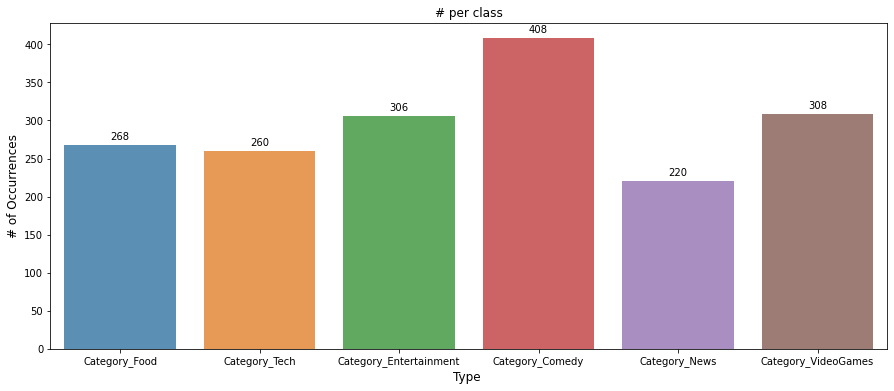

In [43]:
x=image_df[categories].sum()
#plot
plt.figure(figsize=(15,6))
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("# per class")
plt.ylabel('# of Occurrences', fontsize=12)
plt.xlabel('Type ', fontsize=12)
#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

From the graph we can see that there is imbalanced data across all video categories. However, as this a multilabel classifcation problem, it is not possible to achieve a good balance of samples as one Id may contain different number of categories and resmapling will not be possible to achieve. Hence, in the modelling section, I will be using the "weighted" f1-score to measure the performance as it is tailored for imbanced dataset where it assigns a weight to each variable based on the category

## 2.2.1.2 Multilabel Tags Occurrence Analysis - How many multilabelled Images? & Which Category are likely to go together


### How many multilabelled images?

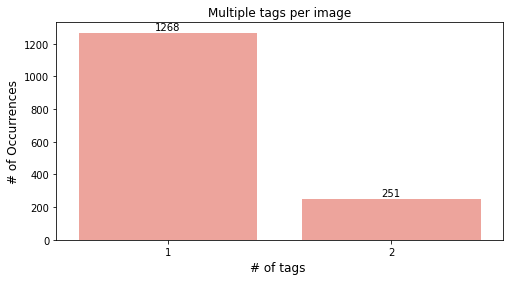

In [21]:
x=image_df[categories].sum(axis=1).value_counts()

#plot
plt.figure(figsize=(8,4))
ax = sns.barplot(x.index, x.values, alpha=0.8,color='salmon')
plt.title("Multiple tags per image")
plt.ylabel('# of Occurrences', fontsize=12)
plt.xlabel('# of tags ', fontsize=12)

#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

From the above bar chart, we can see that the maximum number of categories that each Id belongs is 2 categories. Also, the population of the 2 tags occurence is comparatively lesser by 79% 1 tag occurence. Hence the population of multilabelled Text is only 17%. We will be analysis which categories go together in the later section where i deep dive into category

### Which categories is likely to go together?


Text(0.5, 0, 'Type ')

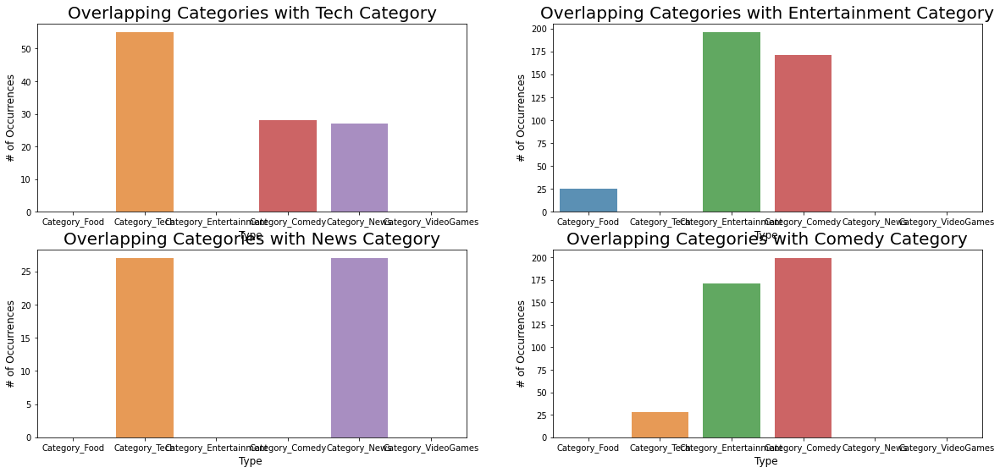

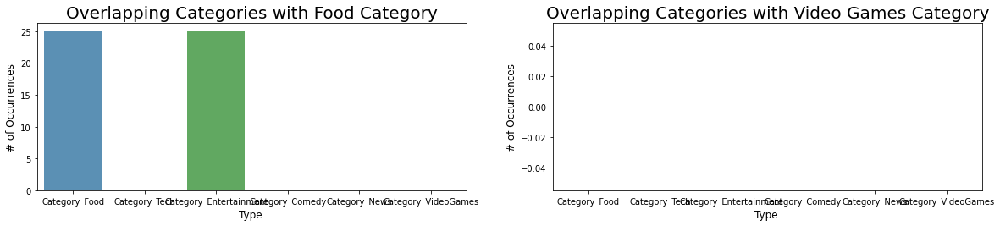

In [22]:
plt.figure(figsize=(20,9))
plt.subplot(2, 2, 1)
Tech_category_image_df=image_df[image_df['Category_Tech']==1]
x=Tech_category_image_df[Tech_category_image_df["Number of Tags"]==2][categories].sum()
#plot
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Overlapping Categories with Tech Category",fontsize=20)
plt.ylabel('# of Occurrences', fontsize=12)
plt.xlabel('Type ', fontsize=12)

plt.subplot(2, 2, 2)
Entertainment_category_image_df=image_df[image_df['Category_Entertainment']==1]
x=Entertainment_category_image_df[Entertainment_category_image_df["Number of Tags"]==2][categories].sum()
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Overlapping Categories with Entertainment Category",fontsize=20)
plt.ylabel('# of Occurrences', fontsize=12)
plt.xlabel('Type ', fontsize=12)

plt.subplot(2, 2, 3)
News_category_image_df=image_df[image_df['Category_News']==1]
x=News_category_image_df[News_category_image_df["Number of Tags"]==2][categories].sum()
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Overlapping Categories with News Category",fontsize=20)
plt.ylabel('# of Occurrences', fontsize=12)
plt.xlabel('Type ', fontsize=12)

plt.subplot(2, 2, 4)
comedy_category_image_df=image_df[image_df['Category_Comedy']==1]
x=comedy_category_image_df[comedy_category_image_df["Number of Tags"]==2][categories].sum()
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Overlapping Categories with Comedy Category",fontsize=20)
plt.ylabel('# of Occurrences', fontsize=12)
plt.xlabel('Type ', fontsize=12)

plt.figure(figsize=(20,8))
plt.subplot(2, 2, 1)
Food_category_image_df=image_df[image_df['Category_Food']==1]
x=Food_category_image_df[Food_category_image_df["Number of Tags"]==2][categories].sum()
#plot
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Overlapping Categories with Food Category",fontsize=20)
plt.ylabel('# of Occurrences', fontsize=12)
plt.xlabel('Type ', fontsize=12)

plt.subplot(2, 2, 2)
VideoGames_category_image_df=image_df[image_df['Category_VideoGames']==1]
x=VideoGames_category_image_df[VideoGames_category_image_df["Number of Tags"]==2][categories].sum()
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Overlapping Categories with Video Games Category",fontsize=20)
plt.ylabel('# of Occurrences', fontsize=12)
plt.xlabel('Type ', fontsize=12)

<h4>Insights:</h4>
    
1. Categories that go together with Tech? - Comedy & News
2. Categories that go together with Entertainment? - Food & Comedy
3. Categories that go together with News? - Tech
4. Categories that go together with Comedy?  - Tech & Entertainment 
5. Categories that go together with Food?  - Entertainment 
6.  Categories that go together with VideoGames? - None

## 2.2.1.3 Correlation Analysis - Which categories are related?



<AxesSubplot:title={'center':'Correlation between categories'}>

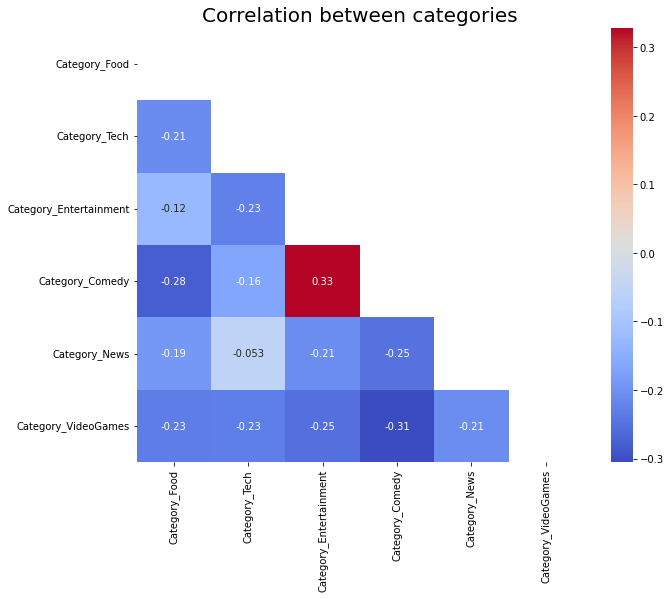

In [15]:
temp_df=df[categories]
corr=image_df[categories].corr()
plt.figure(figsize=(10,8))
plt.title("Correlation between categories",fontsize=20)
sns.heatmap(corr,cmap='coolwarm',mask=np.triu(np.ones_like(df.corr(), dtype=bool)),
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values, annot=True)

<h4>Insights:</h4>
<b>Correlation between video categories</b><br>
Overall correlation between the 6 categories is not very strong.
However, I have identified some categories with strong correlation between each other<br>
1. Comedy Vs Entertainment(0.32) <br>
2. Comedy Vs Food (-0.3)<br>
3. Comedy Vs Video Games(0.24)<br>

An interesting insight is that those categories with strong correlation always have the category comedy which would mean that the category comedy usually contains elements of entertainment, food and video games.

<a id='222'><h2> 2.2.2 Thumbnail Image Understanding and Analysis</h2></a>

### 2.2.2.1 Overall Thumbnail Understanding and Analysis

Next, I wil do an overall thumbnail iamge analysis before deep diving into the image analysis from each category

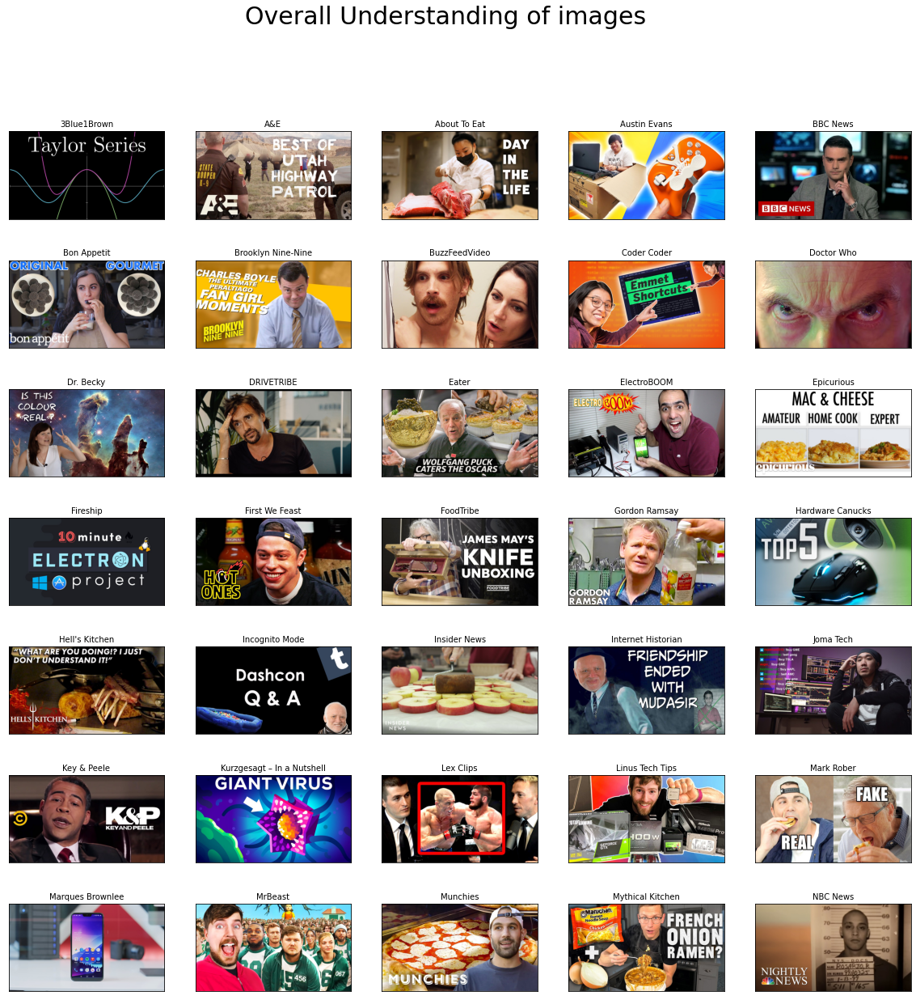

In [53]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20,20))
plt.suptitle("Overall Understanding of images",fontsize=30)
for i in range(35):
    filename_list=os.listdir('./data/images/'+Channel_List[i])
    plt.subplot(7,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.title(Channel_List[i],fontsize=10)
    plt.imshow(load_img(r"data/images/"+Channel_List[i]+"/"+filename_list[0]))
    #plt.xlabel(class_names[y_train[i][0]])
plt.show()

I have plotted out the image from each channel, notice that for all images there are: 
- Specific logos
- Specifc icons 
- Specific characters
-  Specific color tone

<b>Hence, we can infer that the image properties vary across different categories. Hence, during the data preparation we would need to take into consideration of the different image properties when cleaning the image so as to not lose important information.</b>

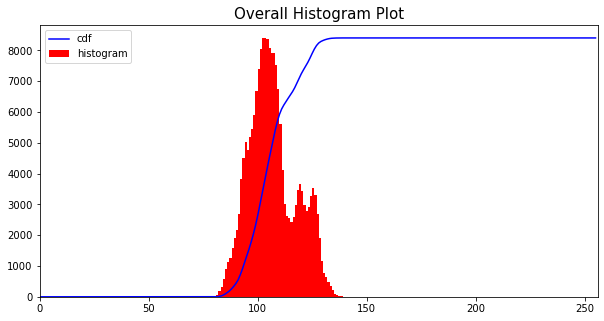

In [54]:
plt.figure(figsize=(10,5))
img_mean=image_df.drop(columns=['Filename', 'Channel', 'VideoCategory', 'Category_Food',
       'Category_Tech', 'Category_Entertainment', 'Category_Comedy',
       'Category_News', 'Category_VideoGames','Number of Tags']).mean()
hist,bins = np.histogram(img_mean,256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(img_mean,256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.title("Overall Histogram Plot",fontsize='15')
plt.show()


I will be using the histogram plot for all image analysis in the later section so let me explain how to interpret this histogram plot. The X-axis represents the pixel intensity levels of the image. The intensity level usually ranges from 0 to 255. For a gray-scale image, there is only one histogram, whereas an RGB colored image will have three 2-D histograms — one for each color. The Y-axis of the histogram indicates the frequency or the number of pixels that have specific intensity values.

### Statistical Analysis of Overall Images from all category
As shown in the histogram plot, there is a <b>sharp rise in cdf from 0 to 8000 pixels between the range of 80 to 140 intensity level of the image.</b> There is a <b>sharp peak in middle which indicates the high frequency of 8000 pixels between 120 to 150 intensity level of the image.</b> There is also a <b>second peak</b> where there is the second highest frequency of 3000 pixels between the range of 120 to 140 intensity level of the image</b>



## 2.2.2.2 Deeper dive into Thumbnail Image Understanding and Analysis in each category

## 2.2.2.2.1 Food Category

 First, I will be creating a new food category dataframe for this analysis.

In [19]:
Food_category_df=image_df[image_df['Category_Food']==1]

## A) Occurence of Multiple Tag in Food Category

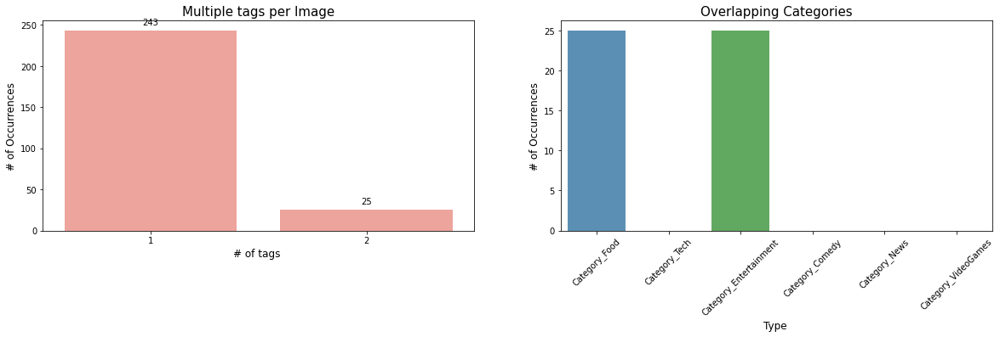

In [111]:
def plot_occ_tag(df):
    x=df["Number of Tags"].value_counts()
    plt.figure(figsize=(20,10))
    plt.subplot(2, 2, 1)
    ax = sns.barplot(x.index, x.values, alpha=0.8,color='salmon')
    plt.title("Multiple tags per Image",fontsize=15)
    plt.ylabel('# of Occurrences', fontsize=12)
    plt.xlabel('# of tags ', fontsize=12)

    #adding the text labels
    rects = ax.patches
    labels = x.values
    for rect, label in zip(rects, labels):
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

    x=df[df["Number of Tags"]==2][categories].sum()
    plt.subplot(2, 2, 2)
    ax= sns.barplot(x.index, x.values, alpha=0.8)
    plt.title("Overlapping Categories",fontsize=15)
    plt.ylabel('# of Occurrences', fontsize=12)
    plt.xlabel('Type ', fontsize=12)
    plt.xticks(rotation=45)

plot_occ_tag(Food_category_df)

### Insights for Occurence of Multiple Tag in Food Category:
In the food category, the ocurrence of multilabeled images is generally quite low at 25. The number of image that only belongs to the food category is higher at 243. This would mean that the images in the food category mostly contains only image element regarding food. Hence the food category may be easier to predict. We can also infer that for those images that are multilabelled, food is usaully multilabelled with entertainment. 

Note: In the later sections I have segmented the images for each section into 3 types for analysis:<br>
        1. Overall Channel/Image/Histogram in "Food Category"<br>
        2. Single Tag category - Image is labelled with only "Food Category"<br>
        2. Multi Tag category - Other than "Food Category", image is multilablled with other categories<br。

## B) Channel Analysis in Food Category

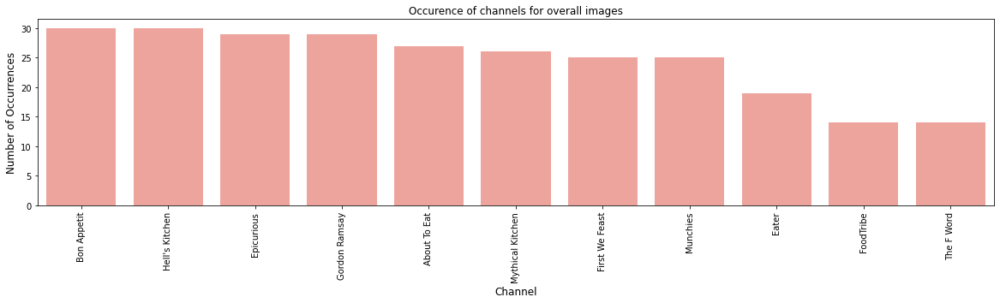

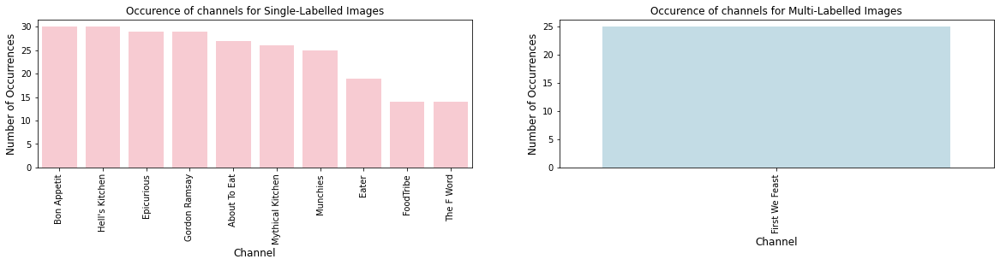

In [107]:
def plot_channel(df):
    cnt_pro = df['Channel'].value_counts()
    plt.figure(figsize=(20,4))
    sns.barplot(cnt_pro.index, cnt_pro.values, alpha=0.8,color='salmon')
    plt.ylabel('Number of Occurrences', fontsize=12)
    plt.xlabel('Channel', fontsize=12)
    plt.xticks(rotation=90)
    plt.title("Occurence of channels for overall images")
    plt.show()

    cnt_pro = df[df["Number of Tags"]==1]['Channel'].value_counts()
    plt.figure(figsize=(20,7))
    plt.subplot(2, 2, 1)
    sns.barplot(cnt_pro.index, cnt_pro.values, alpha=0.8,color='lightpink')
    plt.ylabel('Number of Occurrences', fontsize=12)
    plt.xlabel('Channel', fontsize=12)
    plt.xticks(rotation=90)
    plt.title("Occurence of channels for Single-Labelled Images")


    cnt_pro = df[df["Number of Tags"]==2]['Channel'].value_counts()
    plt.subplot(2, 2, 2)
    sns.barplot(cnt_pro.index, cnt_pro.values, alpha=0.8,color='lightblue')
    plt.ylabel('Number of Occurrences', fontsize=12)
    plt.xlabel('Channel', fontsize=12)
    plt.xticks(rotation=90)
    plt.title("Occurence of channels for Multi-Labelled Images")

plot_channel(Food_category_df)  

### Insights for channel Analysis:
From the above charts, we can see that for multilabelled iamges in the food category, it only belongs to one particular channel which is 'First We Feast'. This would mean that the image propertuw would likely to be similar for multi-tagged images in the food categories. As for  single tage category there are 10 channels involved which means that the image porperties are likely to differ. Hence, lets perform further iamge analysis. 

## C) Image Analysis in Food Category
### C1) Sample Image Analysis in Food Category
In this section , I have printed out sample iamges from the overall food category, single tag catagory and multilabeleed category. The purpose is to take a look and identify if the images have certain interesting similar porperties that could affect the classification performance in the later stage

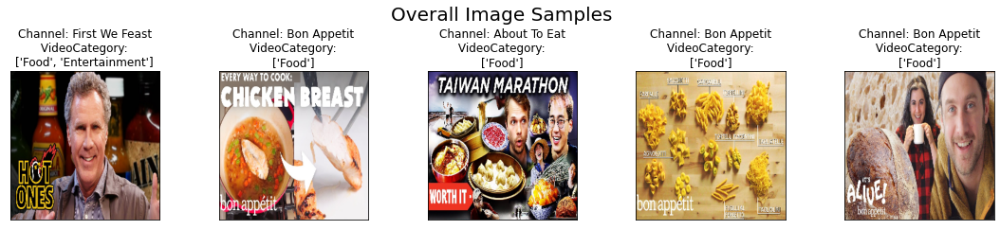

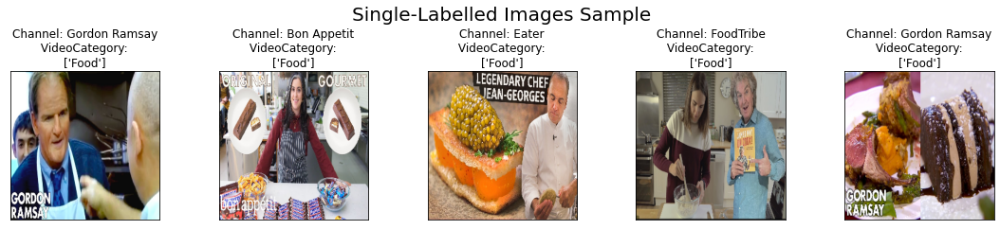

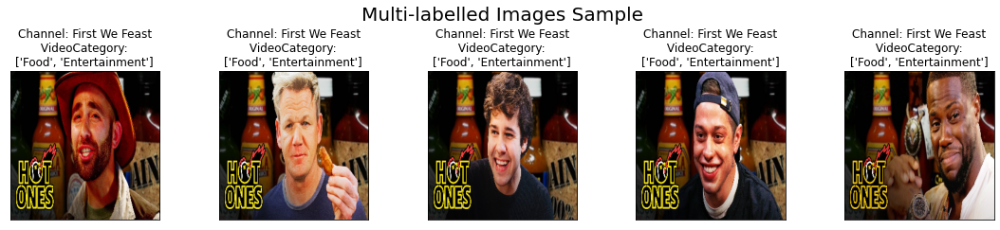

In [103]:
def plot_imgs(df):
    x=df.sample(frac=1).reset_index(drop=True)
    plt.figure(figsize=(18,4.25))
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.suptitle("Overall Image Samples",fontsize=20)
    for i in range(5):
            plt.subplot(1,5,i+1)
            plt.xticks([])
            plt.yticks([])
            plt.grid(False)
            plt.subplots_adjust(left=0.1,bottom=0.1,right=0.9,top=0.9,wspace=0.4,hspace=0.4)
            plt.title("Channel: "+x['Channel'][i]+"\n VideoCategory: \n"+ str(x['VideoCategory'][i]),fontsize=12)
            plt.imshow(x.iloc[:,:-10].iloc[i].values.reshape(256, 256,3))
    plt.show()
    x=df[df["Number of Tags"]==1].sample(frac=1).reset_index(drop=True)
    plt.figure(figsize=(18,4.25))
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.suptitle("Single-Labelled Images Sample",fontsize=20)
    for i in range(5):
            plt.subplot(1,5,i+1)
            plt.xticks([])
            plt.yticks([])
            plt.grid(False)
            plt.subplots_adjust(left=0.1,bottom=0.1,right=0.9,top=0.9,wspace=0.4,hspace=0.4)
            plt.title("Channel: "+x['Channel'][i]+"\n VideoCategory: \n"+ str(x['VideoCategory'][i]),fontsize=12)
            plt.imshow(x.iloc[:,:-10].iloc[i].values.reshape(256, 256,3))
    x=df[df["Number of Tags"]==2].sample(frac=1).reset_index(drop=True)
    plt.figure(figsize=(18,4.25))
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.suptitle("Multi-labelled Images Sample",fontsize=20)
    for i in range(5):
            plt.subplot(1,5,i+1)
            plt.xticks([])
            plt.yticks([])
            plt.grid(False)
            plt.subplots_adjust(left=0.1,bottom=0.1,right=0.9,top=0.9,wspace=0.4,hspace=0.4)
            plt.title("Channel: "+x['Channel'][i]+"\n VideoCategory: \n"+ str(x['VideoCategory'][i]),fontsize=12)
            plt.imshow(x.iloc[:,:-10].iloc[i].values.reshape(256, 256,3))
plot_imgs(Food_category_df)

### Insights for Image Sample Analysis:
For the sample images of the overall food category, we can see that there are a wide variety of channels involved. There is no specific trend of color tones or properties in the overall food category. However what is common is the elements of food that are always seen in this picture. 

Since the food category has larger number of single labelled category, there is not much difference in the images of the single tag category and the overall. As for the multi-tag category where the images are labelled with food and entertainment, it appears to come from the same channel of First We Feast as all have the same image properties such as the position of the person and the HOT ONES icone at the left most of the picture. Now that we have a gotten a breif idea of the images, lets do some deeper analysis in the image properties. 

### C2) Histogram Plot Analysis in Food Category

We will be doing a histogram analysis to see the frequency of pixels in the image and the specific intensity value of it

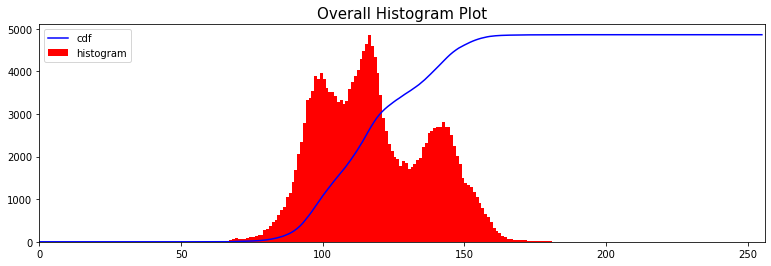

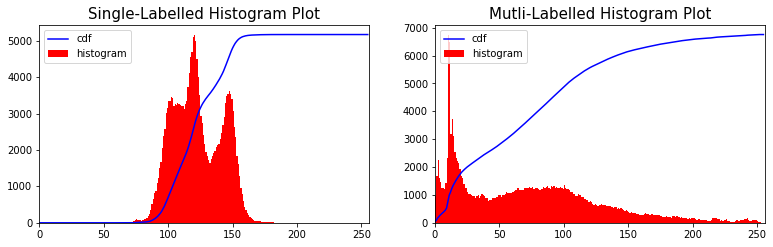

In [93]:
def plot_hist(df):
    plt.figure(figsize=(13,4))
    hist,bins = np.histogram(df.mean(),256,[0,256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * float(hist.max()) / cdf.max()
    plt.plot(cdf_normalized, color = 'b')
    plt.hist(df.mean(),256,[0,256], color = 'r')
    plt.xlim([0,256])
    plt.legend(('cdf','histogram'), loc = 'upper left')
    plt.title("Overall Histogram Plot",fontsize='15')
    plt.show()

    plt.figure(figsize=(13,8))
    plt.subplot(2,2,1)
    img_mean=df[df["Number of Tags"]==1].mean()
    hist,bins = np.histogram(img_mean,256,[0,256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * float(hist.max()) / cdf.max()
    plt.plot(cdf_normalized, color = 'b')
    plt.hist(img_mean,256,[0,256], color = 'r')
    plt.xlim([0,256])
    plt.legend(('cdf','histogram'), loc = 'upper left')
    plt.title("Single-Labelled Histogram Plot",fontsize='15')

    plt.subplot(2,2,2)
    img_mean=df[df["Number of Tags"]==2].mean()
    hist,bins = np.histogram(img_mean,256,[0,256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * float(hist.max()) / cdf.max()
    plt.plot(cdf_normalized, color = 'b')
    plt.hist(img_mean,256,[0,256], color = 'r')
    plt.xlim([0,256])
    plt.legend(('cdf','histogram'), loc = 'upper left')
    plt.title("Mutli-Labelled Histogram Plot",fontsize='15')
plot_hist(Food_category_df)

### Insights for histogram plot statistical analysis:
As shown in the historgram plot: 
1. For the overall histogram and one-tag category histogram plot, there is a sharp rise in cdf from 0 to 5000 between the it
between the range of 80 to 170 intensity level of the image. There is a sharp peak in middle which indicates the high frequency of 5000 pixels between 110 to 130 intensity level of the image. There is also a second peak where there is the second highest frequency of 3000+ pixels between the range of 130 to 170 intensity level of the image. 


2. However, we can see that the multi-tag category histogram plot differs a little where the rise in cdf is quite gradual from 0 to 7000 between the raneg of 0 to 250 intensity levels o fhe image. The histogram is left skewed where the highest peak is at 7000 pixels between the intensity rang to 20 to 30. After that peak the pixel frequency drops to the range of <=1000 pixels.

### C3) Histogram Oriented Gradient Analysis in Food Category
Histogram of Oriented Gradients (HOG) is a feature descriptor used in computer vision and image processing applications for the purpose of the object detection. It is a technique that counts events of gradient orientation in a specific portion of an image or region of interest. HOG is used in a lot of object detection applications.

In [104]:
def plot_hog(df):
    img=np.array(df.iloc[:,:-10].mean()).reshape(256,256,3)
    fd, hog_image_overall = hog(img, orientations=9, pixels_per_cell=(8, 8),cells_per_block=(2, 2), visualize=True, multichannel=True)
    hog_image_overall = exposure.rescale_intensity(hog_image_overall, in_range=(0, 10)) 

    x=df[df["Number of Tags"]==1]
    img=np.array(x.iloc[:,:-10].mean()).reshape(256,256,3)
    fd, hog_image_one_tag = hog(img, orientations=9, pixels_per_cell=(8, 8),cells_per_block=(2, 2), visualize=True, multichannel=True)
    hog_image_one_tag = exposure.rescale_intensity(hog_image_one_tag, in_range=(0, 10))

    y=df[df["Number of Tags"]==2]
    img=np.array(y.iloc[:,:-10].mean()).reshape(256,256,3)
    fd, hog_image_two_tag = hog(img, orientations=9, pixels_per_cell=(8, 8),cells_per_block=(2, 2), visualize=True, multichannel=True)
    hog_image_two_tag = exposure.rescale_intensity(hog_image_two_tag, in_range=(0, 10))
    fig, ax = plt.subplots(1,3, figsize=(12,12))
    ax[0].imshow(hog_image_overall,cmap='gray')
    ax[0].set_title('Overall HOG',fontsize=15)
    ax[1].imshow(hog_image_one_tag,cmap='gray')
    ax[1].set_title('Single-labelled HOG',fontsize=15)
    ax[2].imshow(hog_image_two_tag,cmap='gray')
    ax[2].set_title('Mutli-lablled HOG')
    fig.tight_layout()
    plt.show()
    fig.suptitle("Comparison of Histogram of Oriented Gradients")

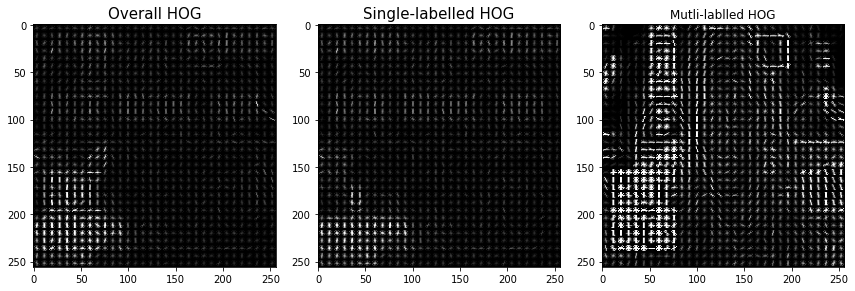

In [105]:
plot_hog(Food_category_df)

### Insights for HOG Analysis:
From the HOG, we can see the extracted image gradient area for the overall and single-labelled images is located at the lower leftmost position of the HOG graph. As forr the multi-labelled, the gradients extracted are located all over the images with most of the gradients also at the lower leftmost position. If we refer back to the sample images for multi-;abelled images, we can se that the histogram of oriented gradient follows exactly the orientation of images edges of the multi-labelled images samples.

## 2.2.2.2.2 Comedy Category

In [109]:
comedy_category_df=image_df[image_df['Category_Comedy']==1]

## A) Occurence of Multiple Tag in Comedy Category

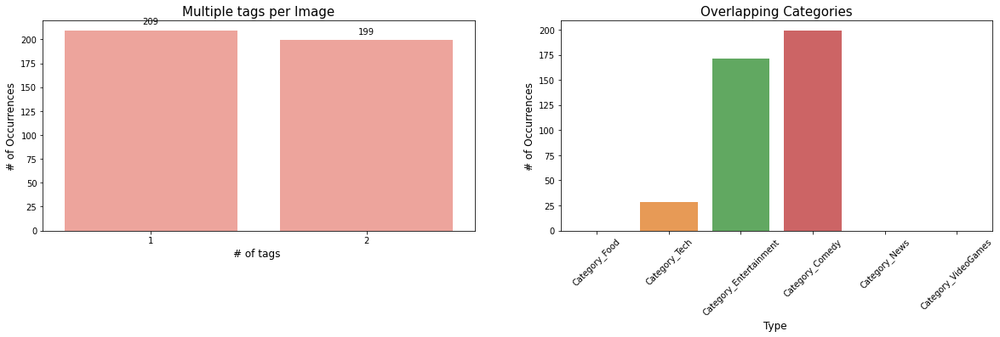

In [112]:
plot_occ_tag(comedy_category_df)

### Occurence of Multiple Tag in Comedy Category
In the comedy category, the ocurrence of single-labelled images is around the same as the multi-labelled images were both are aoround the range of 200~. This would mean the image properties would be spread accross 3 categories and not solely regarding comedy. We can see that the overlappig categories with food are mostly entertainment followed by minority of Tech. 

## B) Channel Analysis in Comedy Category

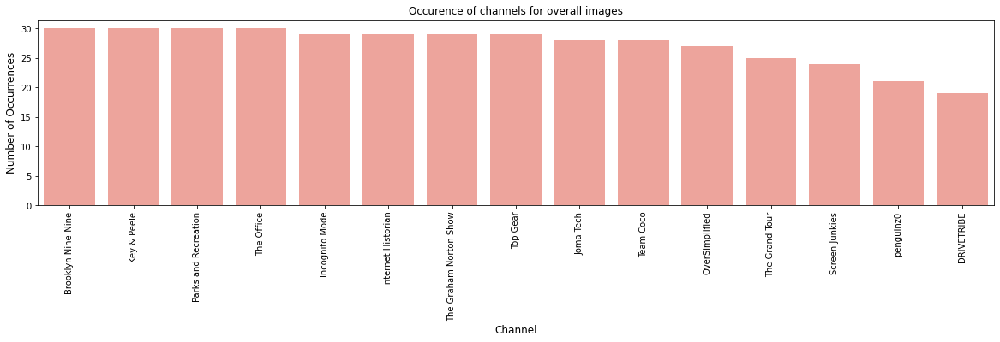

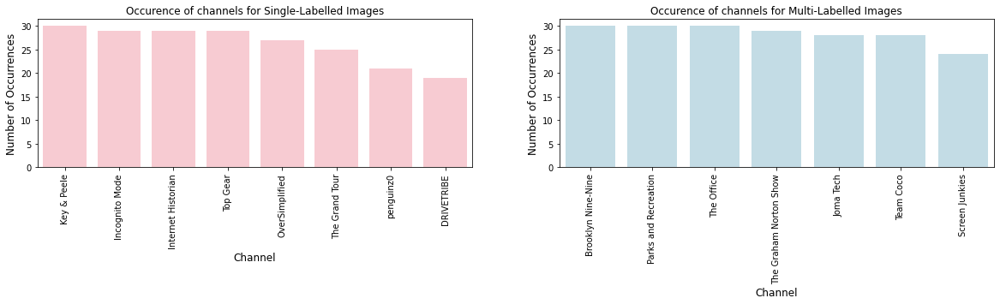

In [113]:
plot_channel(comedy_category_df)  

### Insights for channel Analysis:
From the above charts, we can see that the occurence of channels for single-labelled images and multi-labelled imagegs are around the same where they have around 7 to 8 channels. This would mean the image properties would vary quite greatly as there is a high number of channels for both single and multi-labelled images in comedy category.



## C) Image Analysis in Comedy Category
### C1) Sample Image Analysis in Comedy Category
In this section , I have printed out sample iamges from the overall comedy category, single tag catagory and multilabeleed category. The purpose is to take a look and identify if the images have certain interesting similar porperties that could affect the classification performance in the later stage

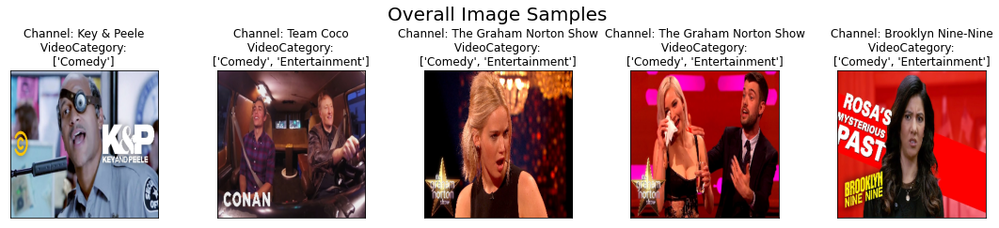

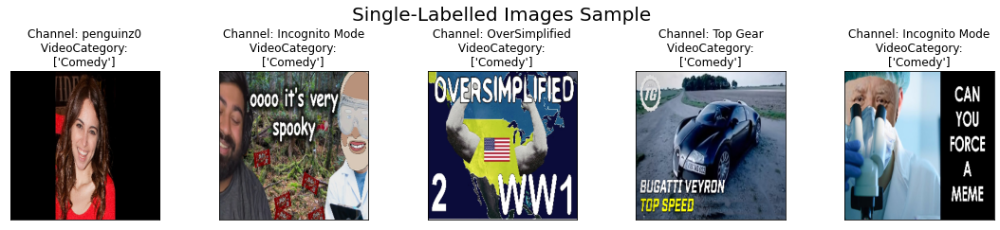

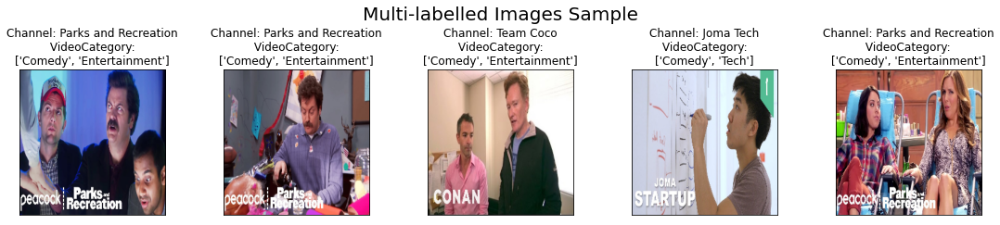

In [114]:
plot_imgs(comedy_category_df)

### Insights for Image Sample Analysis:
For the sample images of the overall comedy category, we can see that there are a wide variety of channels involved. There is no specific trend of color tones or properties in the overall food category. However what is common is the elements of people that are always seen in this picture. 

Since the comedy category has balanced number of single of single and multi-labelled images, there is not much difference in the images of all types, whether overall, single or multi-labelled. However, there is indeed a small trend in the placemnet and position of words/text for multi-labelled iamges where it is located at the lower leftmost position of the images. However, the analysis is still quite surface, hence I will be perfoming histogram and HOG analysis to find out more about the images.

### C2) Histogram Plot Analysis in Comedy Category

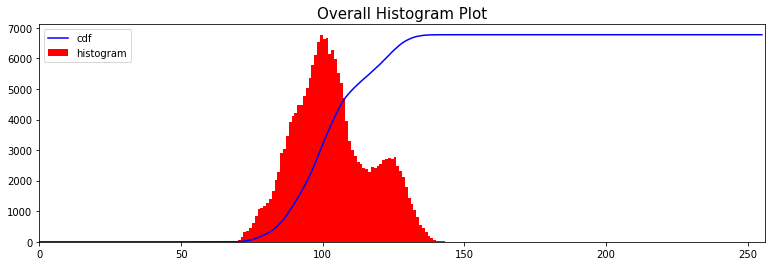

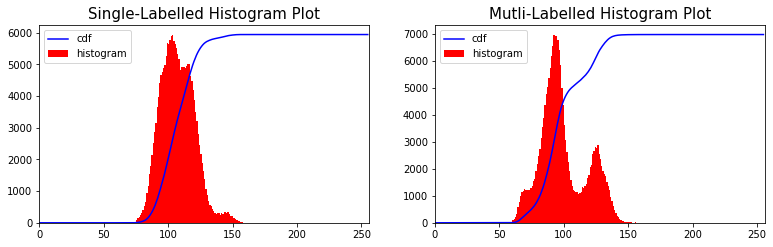

In [115]:
plot_hist(comedy_category_df)

### Insights for histogram plot statistical analysis:
As shown in the historgram plot: 
In general, the plot for the 3 types of iamges looks quite the same. However there are still some minor difference in the range of intensity level of pixels. 
1. For the overall histogram, there is a quite a gradual rise in cdf from 0 to 5000 between the range of 70 to 140 intensity level of the image. There is a sharp peak in middle which indicates the high frequency of 7000 pixels between 70 to 110 intensity level of the image. There is also a second peak where there is the second highest frequency of 2000+ pixels between the range of 120 to 130 intensity level of the image. 


2. For the single labelled images histogram plot, there a sharper rise in cdf from 0 to 6000 pixels between the the range 70 to 160 intensity levels of the images
3. As for multi-labelled images histogram plot, it differs a little from the single-labelled where they is 2 distribution peak sin the histogram. The histogram is multimodal where the highest peak is at 7000 pixels between the intensity rang to 70 to 110. The second peak is at 2000+ pixels between the range of 60 to 159 intensity level of the images.

Given that the occurrence of bothe single and multi-labelled images is equally strog, it explains why the overall histogram plot has the histogram distributioni properties of both single and multi-labelled images

### C3) Histogram Oriented Gradient Analysis in Comedy Category
Histogram of Oriented Gradients (HOG) is a feature descriptor used in computer vision and image processing applications for the purpose of the object detection. It is a technique that counts events of gradient orientation in a specific portion of an image or region of interest. HOG is used in a lot of object detection applications.


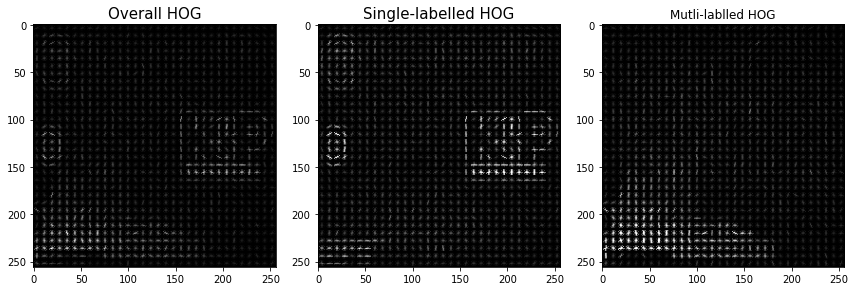

In [117]:
plot_hog(comedy_category_df)

### Insights for HOG Analysis:
From the HOG, we can see the extracted image gradient area for the overall and single-labelled images is located at the middle rightmost position of the HOG graph. We can roughly see that the orientation of graidentes form a text of "KP". If we were to refer back to the images sample, we can decipher that it is from the channle Key & Peele. There are also some extracted gradients that are not that obvioue at the left side of the HOG diagram. 
As forr the multi-labelled HOG, the gradients extracted are located at the lower leftmost position of the HOG diagram. 
Hence, the HOG diagram for the single and multi-labelled images are all quite different.

## 2.2.2.2.3 News Category

In [118]:
News_category_df=image_df[image_df['Category_News']==1]

## A) Occurence of Multiple Tag in News Category

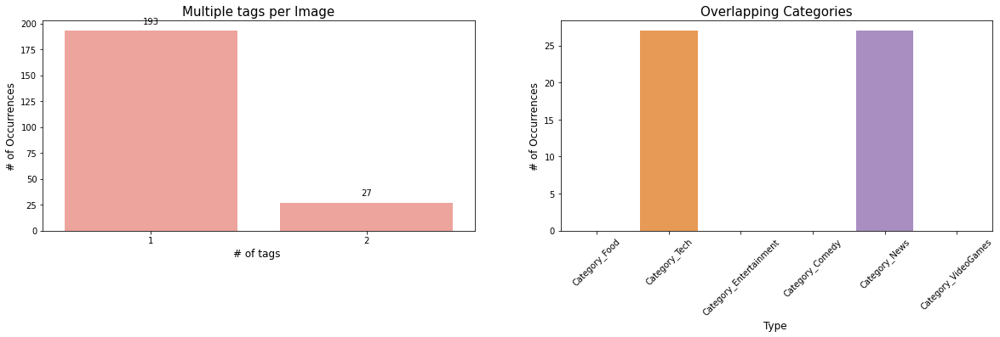

In [119]:
plot_occ_tag(News_category_df)

### Occurence of Multiple Tag in News Category
In the news category, the ocurrence of multilabeled images is generally quite low at 27. The number of image that only belongs to the news category is higher at 193. This would mean that the images in the news category mostly contains only image element regarding news. Hence the news category may be easier to predict. We can also infer that for those images that are multilabelled, food is usaully multilabelled with the category of Tech. 


## B) Channel Analysis in News Category

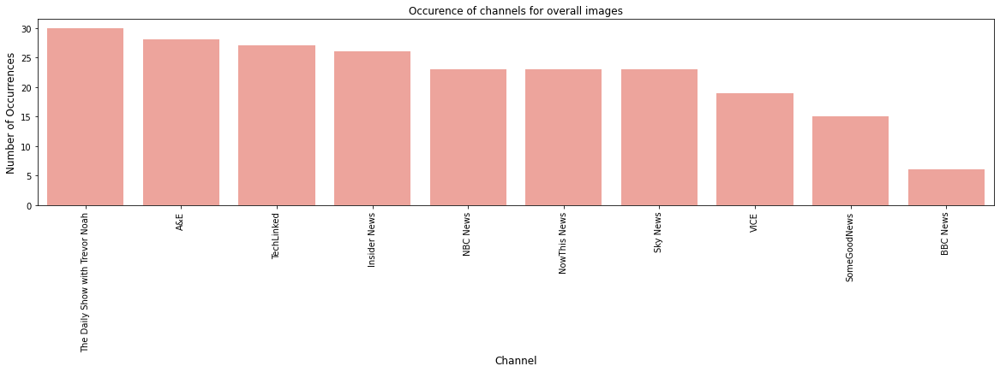

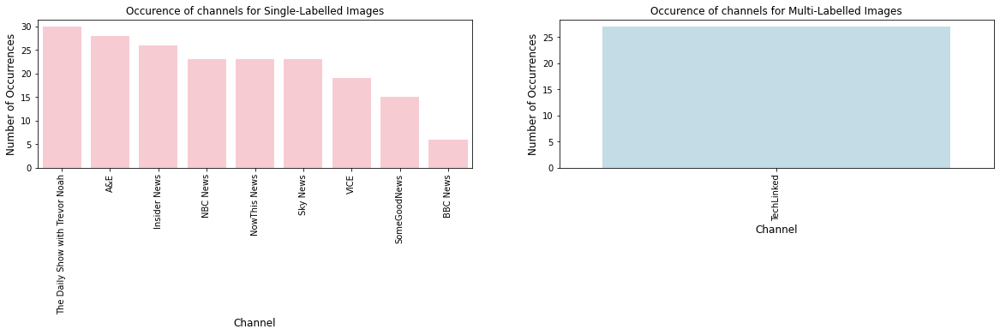

In [120]:
plot_channel(News_category_df)  

### Insights for channel Analysis:
From the above charts, we can see that for multilabelled iamges, it only belongs to one particular channel which is 'TechLinked'. This would mean that the image properties would likely to be similar for multilabelled images in the news categories. As for  single-labelled category there are 9 channels involved which means that the image porperties are likely to differ. Hence, lets perform further iamge analysis. 

## C) Image Analysis in News Category
### C1) Sample Image Analysis in News Category
In this section , I have printed out sample iamges from the overall news category, single-labelled  catagory and multilablled category. The purpose is to take a look and identify if the images have certain interesting similar porperties that could affect the classification performance in the later stage

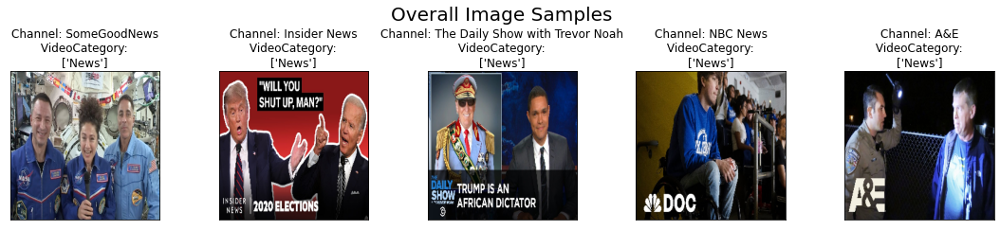

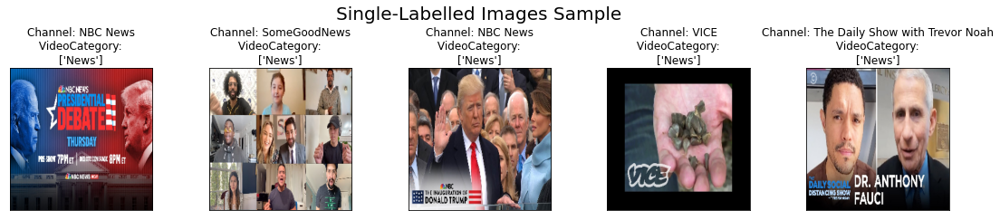

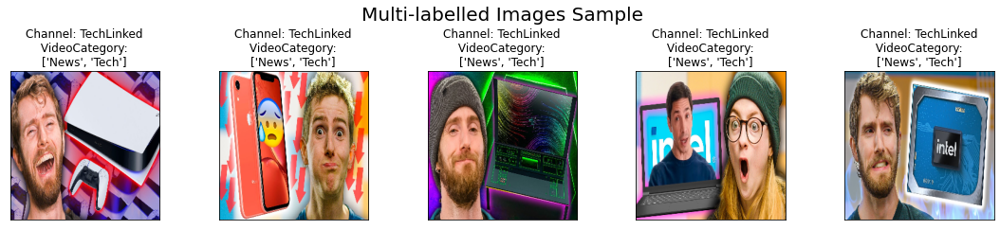

In [123]:
plot_imgs(News_category_df)

### Insights for Image Sample Analysis:
For the sample images of the overall tech category, we can see that there are a wide variety of channels involved. There is no specific trend of color tones or properties in the overall food category. However what is common is the elements of political figures or people of authority.

Since the news category has larger number of single labelled category, there is not much difference in the images of the single tag category and the overall. As for the multi-tag category where the images are labelled with food and entertainment, it appears to come from the same channel of TechLinked all have the same image properties such as the position of the person and the pictutre of the device that is always on the right or left side of the image. Now that we have a gotten a brief idea of the images, lets do some deeper analysis in the image properties. 

### C2) Histogram Plot Analysis in News Category

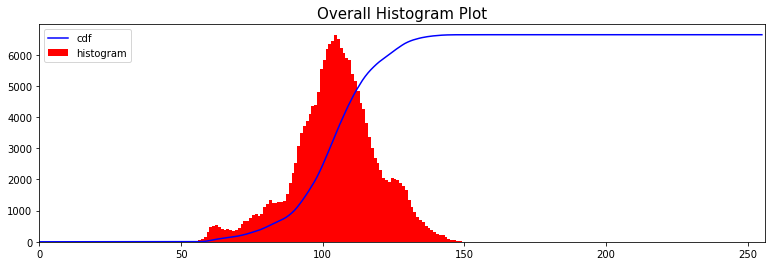

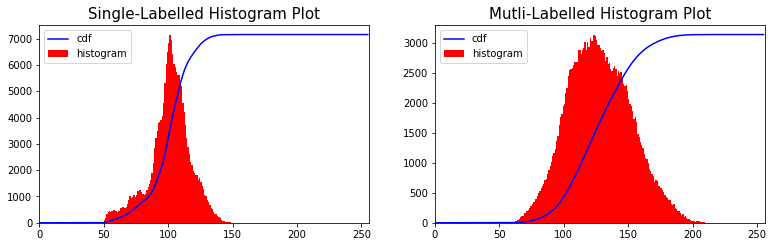

In [125]:
plot_hist(News_category_df)



### Insights for histogram plot statistical analysis:
As shown in the histogram plot: 
1. For the overall histogram and one-tag category histogram plot, there is a sharp rise in cdf from 0 to 6000/7000 between the range of 50 to 150 intensity level of the image. There is a sharp peak in middle which indicates the high frequency of 6000-7000 pixels between 80 to 120 intensity level of the image.


2. However, we can see that the multi-tag category histogram plot differs a little where the rise in cdf is quite gradual from 0 to 3000 between the raneg of 60 to 200 intensity levels o fhe image. The histogram is left skewed where the highest peak is at 3000 pixels. <br>

The major difference between the multi-labelled histogram plot is that the frequency of pixel is much lower than the single-labelled histogram plot. Hence on the overall histogram plot the pixel frequency average out at 6000

### C3) Histogram Oriented Gradient Analysis in News Category

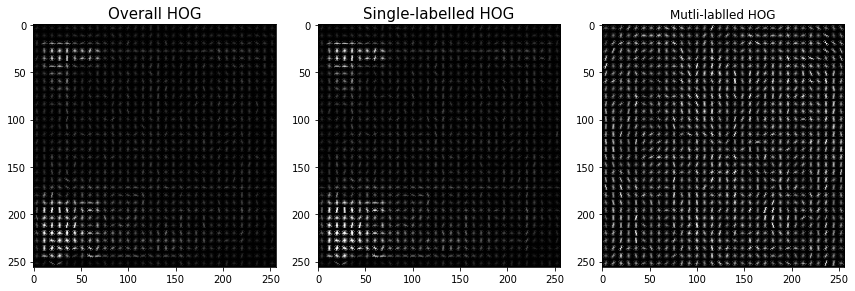

In [127]:
plot_hog(News_category_df)

### Insights for HOG Analysis:
From the HOG, we can see the extracted image gradient area for the overall and single-labelled images is located at 2 locations on is the upper left most position while the other is at lower leftmost position of the HOG graph. As for the multi-labelled, the gradients extracted are located all over the images with no specific location of the pixels.

## 2.2.2.2.4 Video Games Category

In [128]:
VideoGames_category_df=image_df[image_df['Category_VideoGames']==1]

## A) Occurence of Multiple Tag in Video Games Category

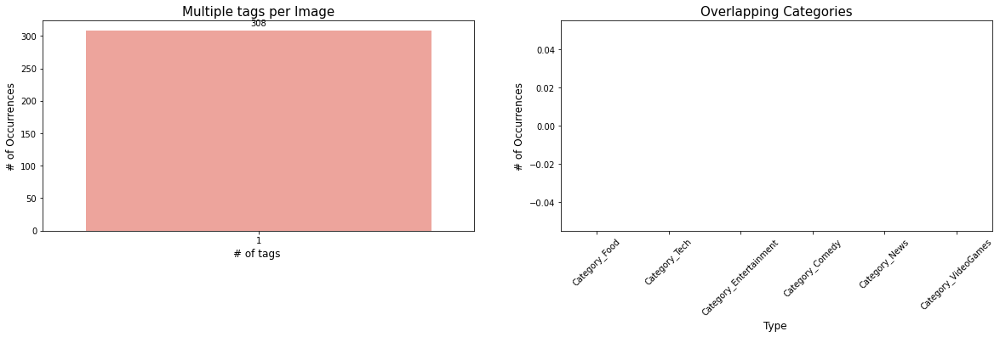

In [136]:
plot_occ_tag(VideoGames_category_df)

### Occurence of Multiple Tag in Food Category
We can see from the above bar chat, that video games have no overlapping categories as all 308 images have only one label which is "VideoGames". This would mean that the iamges properties will not vary across multi or single label images like what we analysed for the other categories

## B) Channel Analysis in Video Games Category

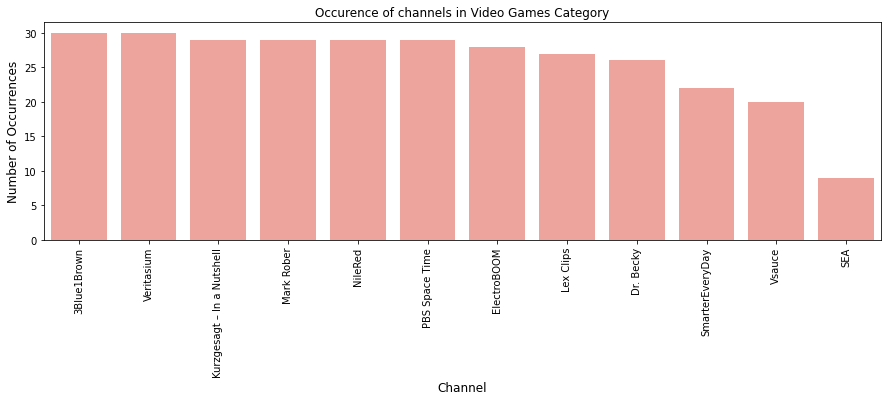

In [130]:
cnt_pro = VideoGames_category_df['Channel'].value_counts()
plt.figure(figsize=(15,4))
sns.barplot(cnt_pro.index, cnt_pro.values, alpha=0.8,color='salmon')
plt.ylabel('Number of Occurrences', fontsize=12)
plt.xlabel('Channel', fontsize=12)
plt.xticks(rotation=90)
plt.title("Occurence of channels in Video Games Category")
plt.show()

### Insights for channel Analysis:
From the above charts, we can see that the video games category contains images from 12 channels in total where the highest count of channel is 3Blue1Brown. With a wide variety of channels, it is likely that the image properties will differ even thought the images are from the same category unless there is a specific trend in images

## C) Image Analysis in Video Games Category
### C1) Sample Image Analysis in Video Games Category
In this section , I have printed out sample iamges from the overall Video Games category, single-labelled  catagory and multilablled category. The purpose is to take a look and identify if the images have certain interesting similar porperties that could affect the classification performance in the later stage

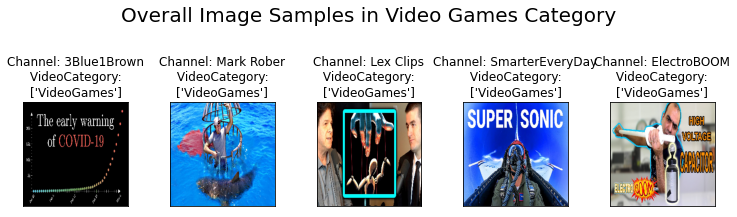

In [135]:
x=VideoGames_category_df.sample(frac=1).reset_index(drop=True)
plt.figure(figsize=(12,4.25))
plt.suptitle("Overall Image Samples in Video Games Category",fontsize=20)
for i in range(5):
        plt.subplot(1,5,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.subplots_adjust(left=0.1,bottom=0.1,right=0.9,top=0.9,wspace=0.4,hspace=0.4)
        plt.title("Channel: "+x['Channel'][i]+"\n VideoCategory: \n"+ str(x['VideoCategory'][i]))
        plt.imshow(x.iloc[:,:-10].iloc[i].values.reshape(256, 256,3))
plt.show()

### Insights for Image Sample Analysis:
For the sample images of the overall video games category, we can see that there are a wide variety of channels involved. There is no specific trend of color tones or properties in the overall food category. However what is common is the elements of video games and gamers.

### C2) Histogram Plot Analysis in Video Games Category

Text(0.5, 1.0, 'Overall Video Games Category Histogram Plot')

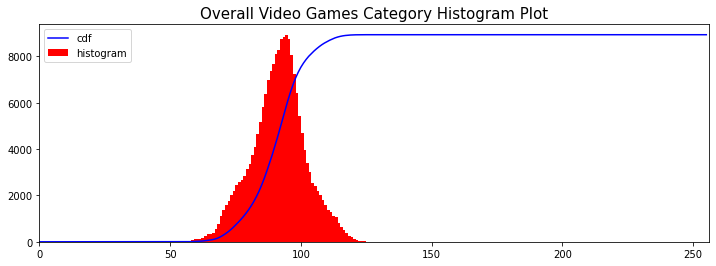

In [140]:
plt.figure(figsize=(12,4))
hist,bins = np.histogram(VideoGames_category_df.mean(),256,[0,256])
cdf_normalized = hist.cumsum() * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(VideoGames_category_df.mean(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.title("Overall Video Games Category Histogram Plot",fontsize='15')

### Insights for histogram plot statistical analysis:
For the overall histogram video games histogram plot, there is a sharp rise in cdf from 0 to 8000 between the it
between the range of 60 to 120 intensity level of the image. There is a sharp peak in middle which indicates the high frequency of 5000 pixels between 110 to 130 intensity level of the image.

### C3) Histogram Oriented Gradient Analysis in Video Games Category

Text(0.5, 1.0, 'Overall Video Games Category')

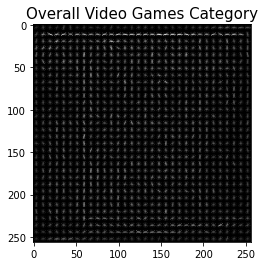

In [142]:
img=np.array(VideoGames_category_df.iloc[:,:-10].mean()).reshape(256,256,3)
fd, hog_image_overall = hog(img, orientations=9, pixels_per_cell=(8, 8),cells_per_block=(2, 2), visualize=True, multichannel=True)
hog_image_overall = exposure.rescale_intensity(hog_image_overall, in_range=(0, 10)) 
plt.imshow(hog_image_overall,cmap='gray')
plt.title('Overall Video Games Category',fontsize=15)

### Insights for HOG Analysis:
From the HOG, we can see the extracted image gradient area for all the video games images are located all over the images with no specific location of the pixels. As analysed above it belongs to too many channels. Hence the images properties would not be too distinct.

## 2.2.2.2.5 Entertainment Category

In [143]:
Entertainment_category_df=image_df[image_df['Category_Entertainment']==1]

## A) Occurence of Multiple Tag in Entertainment Category

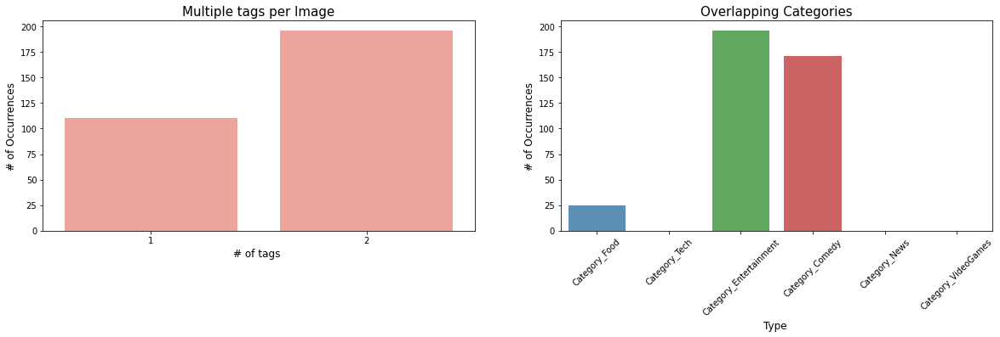

In [149]:
plot_occ_tag(Entertainment_category_df)

### Occurence of Multiple Tag in Entertainment Category
In the food category, the ocurrence of single labelled images is generally quite low at 110 while the multi-labelled images is higher at 196. This would mean that the enertainment category is harder to predict as it has a higher number of multi-labelled images where the image properties coule originate from multiple categories. 
As for the overlapping categories would be majority from comedy followed by food.



## B) Channel Analysis in Entertainment Category

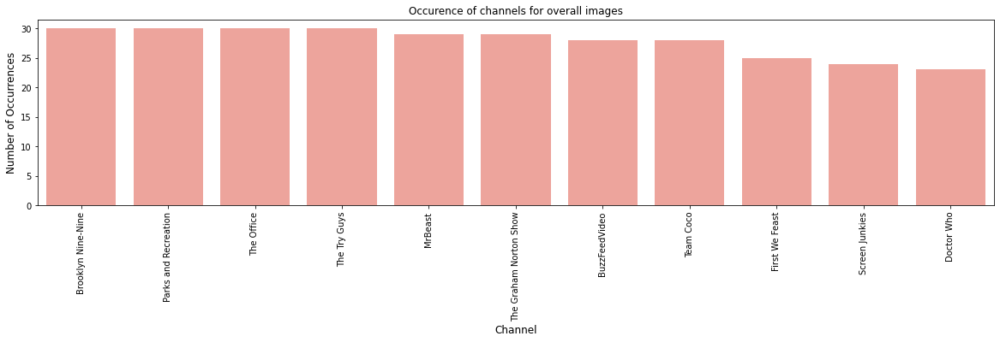

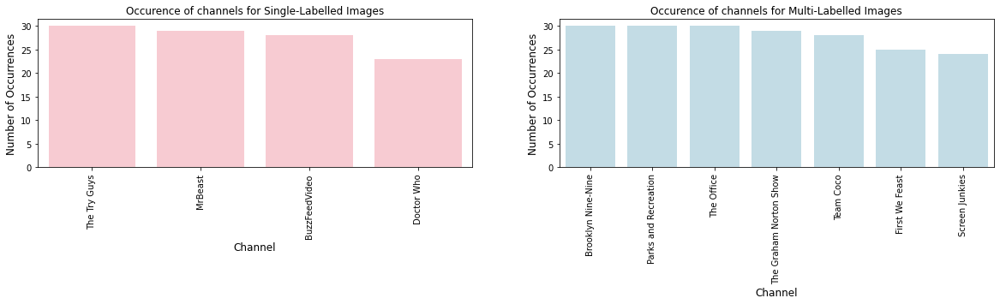

In [165]:
plot_channel(Entertainment_category_df)

### Insights for channel Analysis:
From the above charts, we can see that for multilabelled iamges in the entertainment category, it only belongs to 7 channels while the single labelled iamges only belongs to 4 channels  This would mean that the image properties for single
labelled images may more likely be distinct but for multilabelled there would be more variatey and the features may not be as distinct

## C) Image Analysis in Entertainment Category
### C1) Sample Image Analysis in Entertainment Category
In this section , I have printed out sample iamges from the overall entertainment category, single tag catagory and multilabeleed category. The purpose is to take a look and identify if the images have certain interesting similar porperties that could affect the classification performance in the later stage

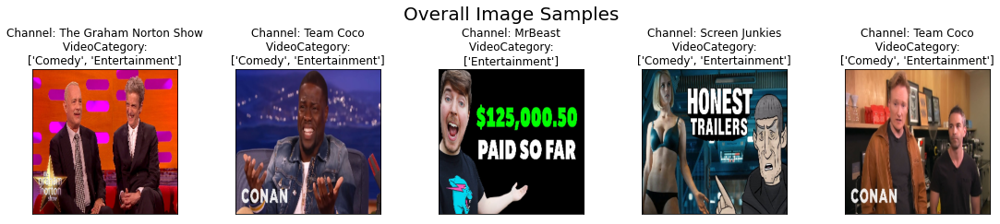

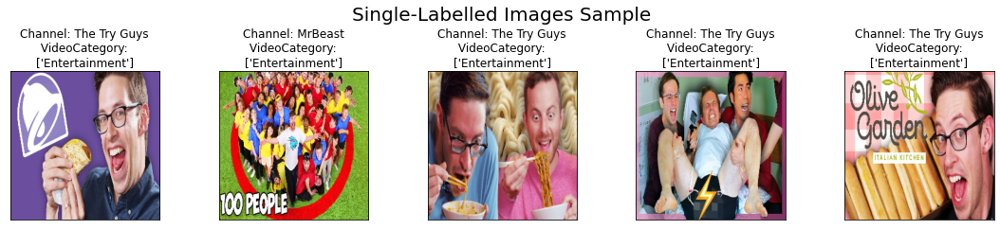

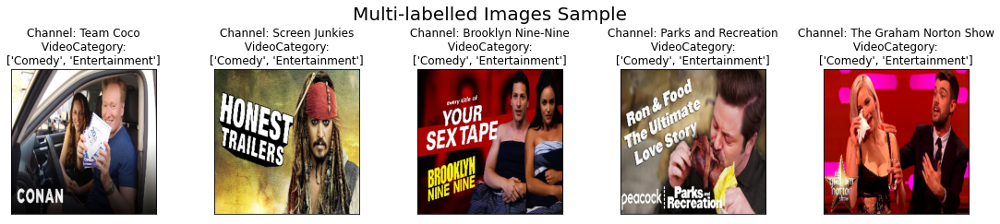

In [166]:
plot_imgs(Entertainment_category_df)

### Insights for Image Sample Analysis:
For the sample images of the overall, single and multi-labelled entertainment category, we can see that there are a wide variety of channels involved. There is no specific trend of color tones or properties in the all images . There are people, tex images involved.

### C2) Histogram Plot Analysis in Entertainment Category

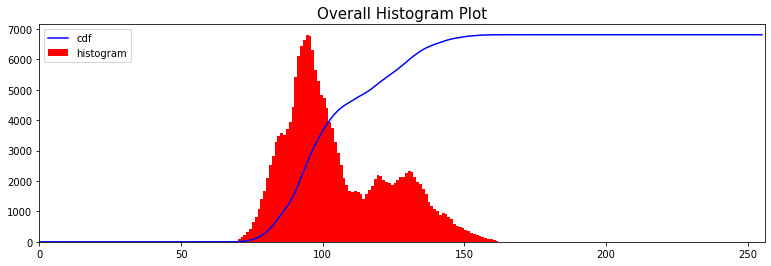

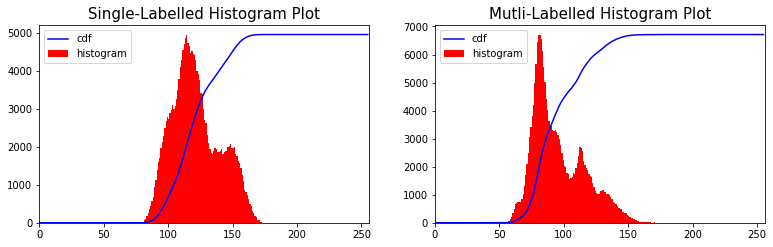

In [168]:
plot_hist(Entertainment_category_df)


### Insights for histogram plot statistical analysis:
As shown in the historgram plot: 
In genera, the histogram of the single and multilabelled have a multimodal distribution. 
1. For the single labelled images histogram plot, there is a gradual rise in cdf from 0 to 5000 between the it
between the range of 80 to 170 intensity level of the image. There is a sharp peak in middle which indicates the high frequency of 5000 pixels between 100 to 130 intensity level of the image. There is also a second peak where there is the second highest frequency of 2000+ pixels between the range of 130 to 170 intensity level of the image. 


2. However, we can see that the multi-tag category histogram plot differs a little where the rise in cdf is quite gradual from 0 to 7000 between the raneg of 50 to 170 intensity levels o fhe image. The histogram is left skewed where the highest peak is at 7000 pixels between the intensity rang to 20 to 30. After that peak the pixel frequency drops to the second peak at 2000~ pixels.It then drops to the 3rd peak at around 1000 pixel between the range of 140 to 150 intensity level of images. 

The major difference between te single and multi-labelled histogram plot would be that the range of intensity level of iamge where the cdf increases is different where the multi-labelled starts off lower at 50 intensity level.


### C3) Histogram Oriented Gradient Analysis in Entertainment Category

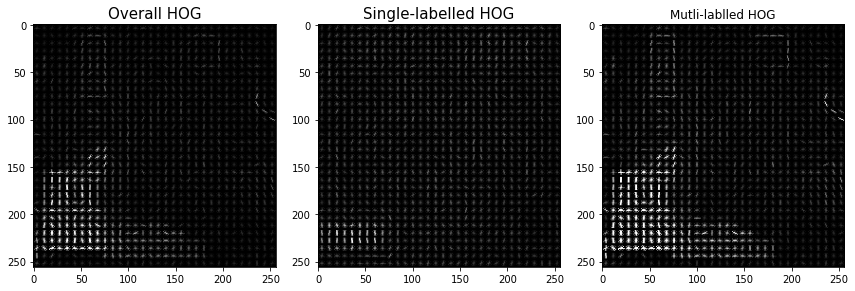

In [169]:
plot_hog(Entertainment_category_df)

### Insights for HOG Analysis:
THe multi-labelled and oeverall HOG diagram is similar where the extracted gradients populates the lowe leftmost area of the diagram. This would mean that the multilabelled images characterisic is stronger than the single labelled characteristics. Nevertheless, the single labelled HOG extracted graidents is also located at the lower leftmost just that the amount of extracted graidents is lesser. Hence entertainment category may turn out to  be harder to predict if the model is not good enough.

## 2.2.2.2.6 Tech Category

In [171]:
Tech_category_df=image_df[image_df['Category_Tech']==1]

## A) Occurence of Multiple Tag in Tech Category

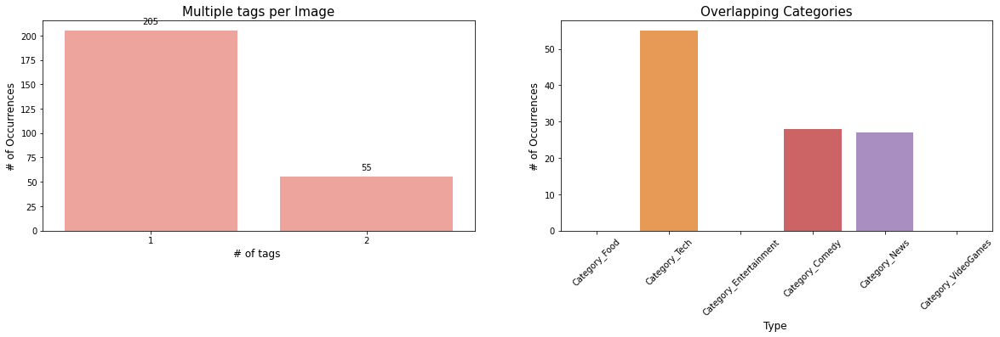

In [172]:
plot_occ_tag(Tech_category_df)

### Occurence of Multiple Tag in Tech Category
In the tech category, the ocurrence of multilabeled images is generally quite low at 55 while the number of image that only belongs to the Tech category is higher at 205. This would mean that the images in the tech category mostly contains only image element regarding tech. Hence the food category may be easier to predict. We can also infer that for those images that are multilabelled, food is usaully multilabelled with comedy and news. 


## B) Channel Analysis in Tech Category

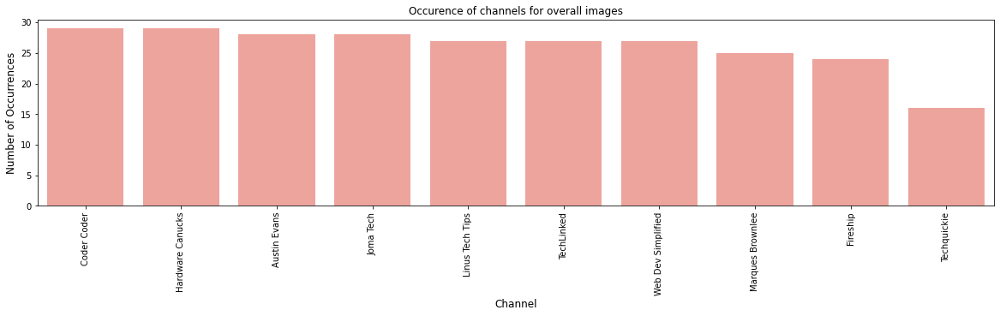

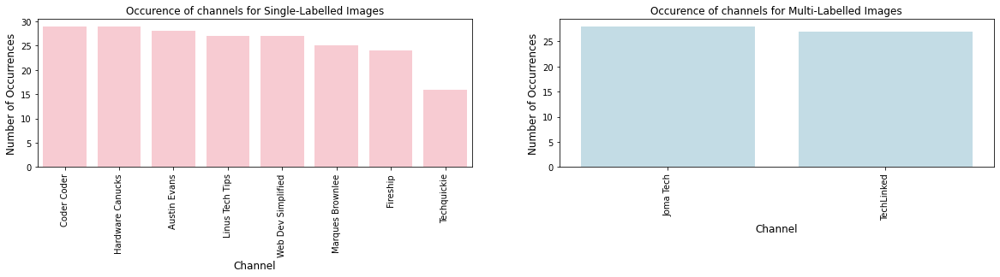

In [174]:
plot_channel(Tech_category_df)

### Insights for channel Analysis:
From the above charts, we can see that for multilabelled iamges in the tech category, it only belongs to 2 particular channel which is 'Joma Tech' and 'Tech Linked. This would mean that the image properties would likely to be similar for multi-tagged images in the tech categories. As for  single tage category there are 8 channels involved which means that the image porperties are likely to differ. Now, lets perform further image analysis. 


## C) Image Analysis in Tech Category
### C1) Sample Image Analysis in Tech Category

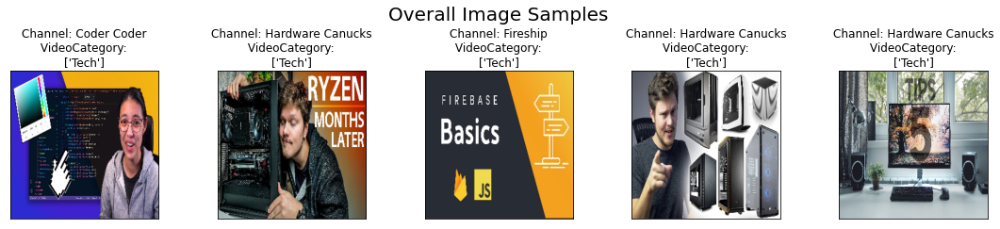

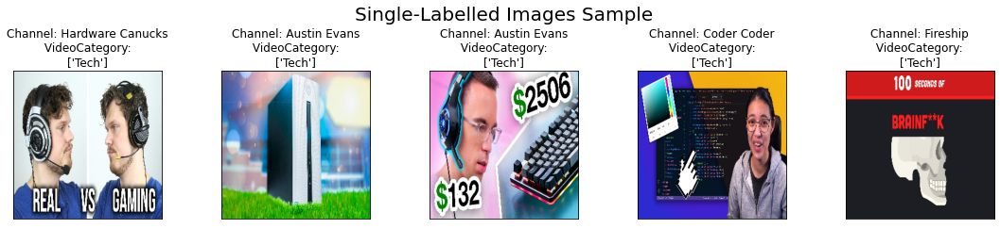

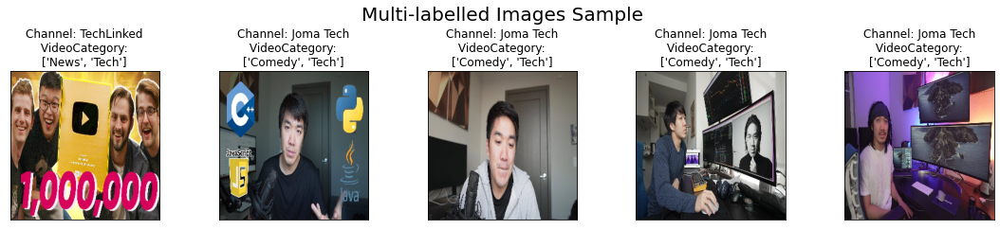

In [175]:
plot_imgs(Tech_category_df)

### Insights for Image Sample Analysis:
For the sample images of the overall tech category, we can see that there are a wide variety of channels involved. There is no specific trend of color tones or properties in the overall food category. However what is common is the elements of food that are always seen in this picture. 

Since the food category has larger number of single labelled category, there is not much difference in the images of the single tag category and the overall. As for the multi-tag category where the images are labelled with comedy and tech, it appears to come from the same 2 channels - 'Joma Tech' & 'TechLinked' with the same few peopl in the thumbnail image. All have the same image properties such as the facialfeatures of person. Now that we have a gotten a breif idea of the images, lets do some deeper analysis in the image properties. 

### C2) Histogram Plot Analysis in Tech Category

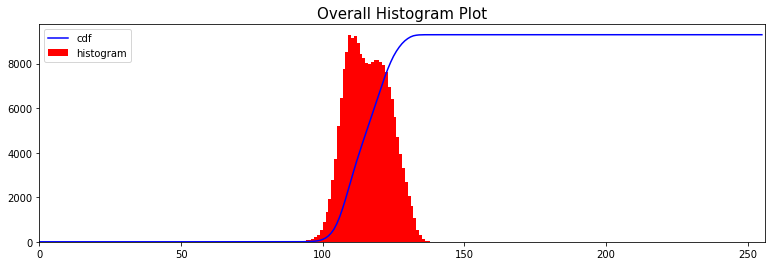

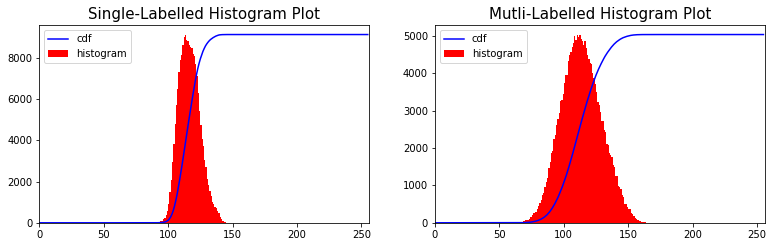

In [177]:
plot_hist(Tech_category_df)


### Insights for histogram plot statistical analysis:
As shown in the histogram plot: 
The histogram of all images in general looks the same
1. For the overall histogram and one-tag category histogram plot, there is a sharp rise in cdf from 0 to 8000 between the range of 100 to 140 intensity level of the image. There is a sharp peak in middle which indicates the high frequency of 8000 pixels\

2. However, we can see that the multi-tag category histogram plot differs a little where the rise in cdf is more gradual from 0 to 5000 between the range of 70 to 160 intensity levels ofvhe image. The histogram is left skewed where the highest peak is at 5000 pixels. <br>

The major difference between the multi-labelled histogram plot is that the intensity level of the image is more widespread as compared to the single labelled histogram plot. 

### C3) Histogram Oriented Gradient Analysis in Entertainment Category

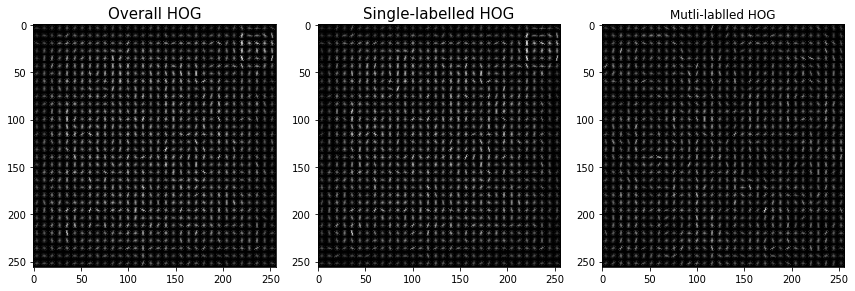

In [178]:
plot_hog(Tech_category_df)

### Insights for HOG Analysis:
From the HOG, we can see the extracted image gradient area for the overall, single-labelled images and multi-labelled are located all over the images. The only difference is that the HOG has a more distinct gradient as compare to the single and multi-labelled HOG

<a id='3'><h1 style="background-color:#FA8072;border-radius:5px;text-align:center;padding:7px;color:white;"><font color="white">3. Data Preparation</h1>

After much exploratory data analysis and understanding of the data from different classes, I will moving on the data preparation of the images. After much trial and error, I realised that <b>identifying the correct processing steps is the most useful for increasing the model performance.</b> Hence, I will be documenting in this section, the selection of data preparation techniques to be used and justifying why based on factors such as model processing power and model perfomance. 

<a id='31'><h2>3.1 Justification & Documentation of Data Preparation Steps</h2></a>

<b>These will be the image processing steps that I will testing out:</b><br>
A) Resizing<br>
B) Gamma Correction<br>
C) Blurring <br>
D) Image Denoising <br>
E) Histogram Equilization<br>
F) Histogram of Oriented Gradient<br>
G) Canny Edge Detection <br>
H) GrayScaling<br>
I) VGG - Pretrained Model for feature extraction


Take note that I will be using a sample machine learning model - Logistic Regression to do my testing of the data preparation steps and document the results of the model performance

## A) Resizing - Decrease processing power needed (compulsory step)

This step would be the compulsory step in the whole data preparation as during my data preparation process, my computer's processing power and ability was not able to support the large pixel size. Hence, Reszing would be vital in order for the rest of the process to work.

Text(0.5, 0.98, 'Sample Image')

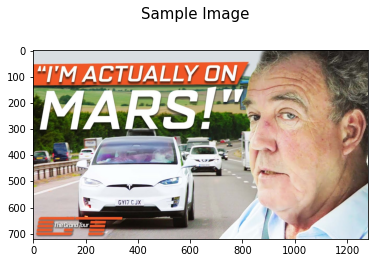

In [130]:
img=image.load_img(r"C:\Users\JiaYi\Downloads\Yr3Sem3 Assignment\TRMA_Assignment\FINAL\data\images\The Grand Tour\0ssucYoYtYE.jpg")
plt.imshow(img)
plt.suptitle("Sample Image",fontsize="15")

In [8]:
print("Image Shape:",image.img_to_array(img).shape)
print()
print("Total Pixels:",image.img_to_array(img).shape[0]*image.img_to_array(img).shape[1]*image.img_to_array(img).shape[2])

Image Shape: (720, 1280, 3)

Total Pixels: 2764800


Given that the image array is too big for processing as it adds up to a total 720 X 1280 X 3=2764800 we will have to resize it to a pixel resolution to a size that retains the image properties while have a size that will greatly reduce processing time. 

Given that image resolutions are normally in number of 32,64,128, 256,512..etc. I will be testing this sizes out to see which one is the most suitable pixel resolution.

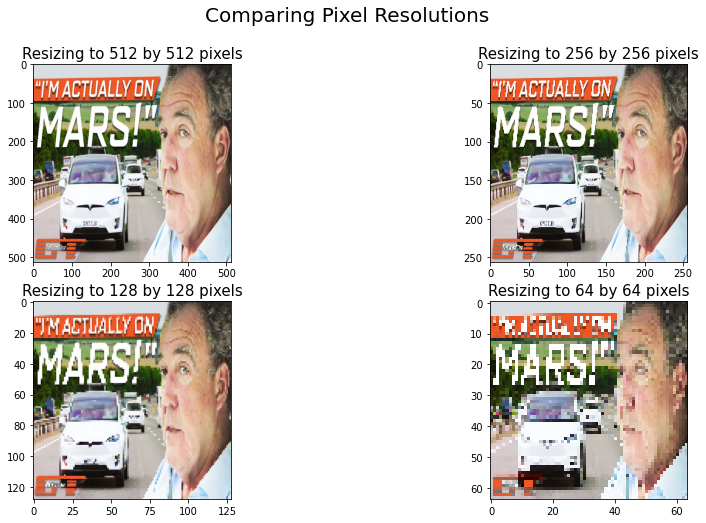

In [131]:
img=np.array(img)
plt.figure(figsize=(15,8))
plt.suptitle("Comparing Pixel Resolutions",fontsize=20)
plt.subplot(2, 2, 1)
plt.imshow(cv2.resize(img,(512,512)))
plt.title("Resizing to 512 by 512 pixels",fontsize='15')

plt.subplot(2, 2, 2)
plt.imshow(cv2.resize(img,(256,256)))
plt.title("Resizing to 256 by 256 pixels",fontsize='15')

plt.subplot(2, 2, 3)
plt.imshow(cv2.resize(img,(128,128)))
plt.title("Resizing to 128 by 128 pixels",fontsize='15')

plt.subplot(2, 2, 4)
plt.imshow(cv2.resize(img,(64,64)))
plt.title("Resizing to 64 by 64 pixels",fontsize='15')

img=cv2.resize(img,(256,256))

From the image, we can see that the pixel resolutions that retain the image properties are (256,256) and (512,512). Since images with resolution of (256,256) is smaller in pixel sizing can achieve the same effect as image with pixel resolution (1024,1024), we will be setting (256,256) as the optimal pixel sizing 

<b>Take note that for the resizing step, I would not be testing on the model as my computer processing ability can only process up to (256,256,3). Else, there will be "ResourceExhaustedError"</b>

I will just making a record of the f1-score for this pixel resolution

In [72]:
for i in tqdm(range(df.shape[0])):
    img=img_to_array(load_img("data/images/"+str(df['Channel'][i])+"/"+str(df['Filename'][i])+".jpg"))
    img=cv2.resize(img,(256,256))
    dataset.append(img.flatten())
X=np.array(colored_dataset)/255
y=np.array(df[categories])
X_train,X_test, y_train,y_test=train_test_split(X,y,random_state=42,test_size=0.2)

logreg_classifier =MultiOutputClassifier(LogisticRegression())
logreg_classifier.fit(X_train, y_train)
predictions = logreg_classifier.predict(X_test)
predictions = np.argmax(predictions, axis=1)
y_test=np.argmax(y_test, axis=1)
print("F1 Score:",f1_score(y_test, predictions,average='weighted'))

100%|█████████████████████████████████████████████████████████████████████████████| 1519/1519 [00:15<00:00, 100.57it/s]


F1 Score: 0.4542360658970425


<h3 style="border-style:groove;padding:10px;text-align:centre;border-radius:5px;text-align:center;">A) Conclusion: The Optimal Pixel Resolution  would be 256,256,3</h3>

## B) Gamma Correction

Gamma correction can be used to control the overall brightness of an image. It can be used with images that are found to be either bleached out or too dark. Also, it can help to artificially boost or increase image tonal data values

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Gamma Value - 1.05')

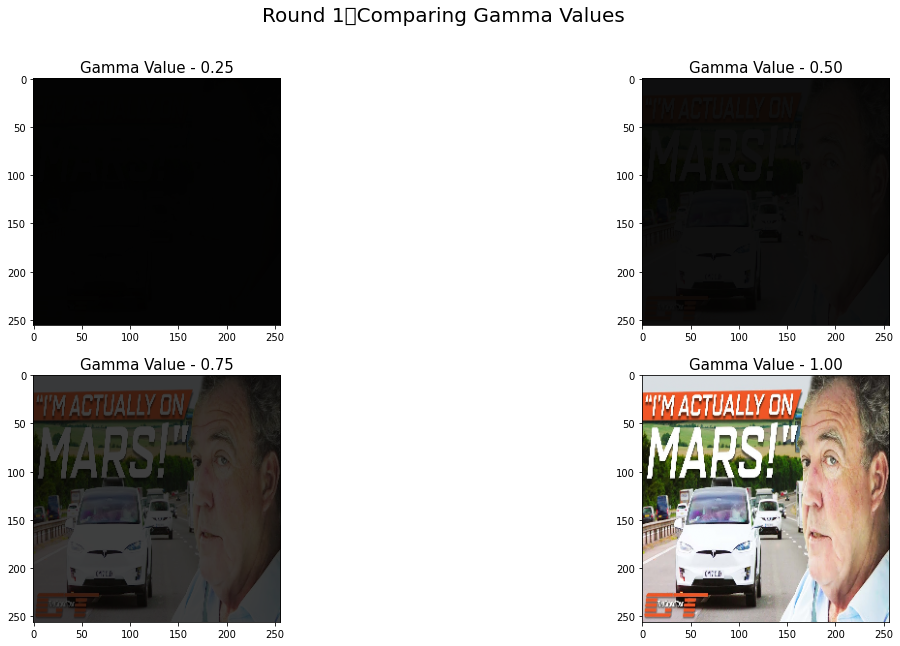

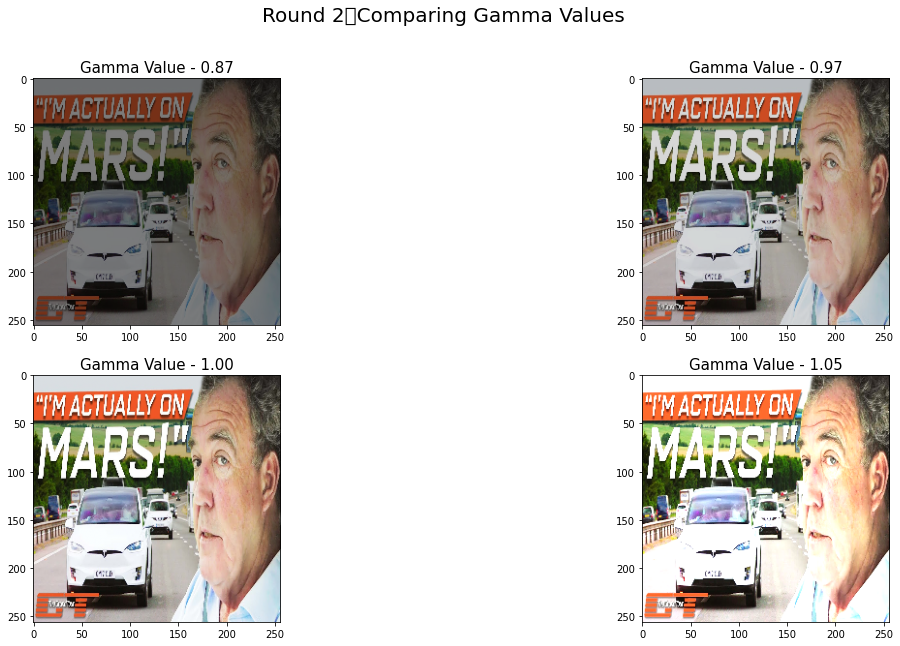

In [132]:
plt.figure(figsize=(20,10))
plt.suptitle("Round 1：Comparing Gamma Values",fontsize=20)
plt.subplot(2, 2, 1)
plt.imshow(np.power(img, 1/4)/255)
plt.title("Gamma Value - 0.25",fontsize='15')
plt.subplot(2, 2, 2)
plt.imshow(np.power(img, 2/4)/255)
plt.title("Gamma Value - 0.50",fontsize='15')
plt.subplot(2, 2, 3)
plt.imshow(np.power(img, 3/4)/255)
plt.title("Gamma Value - 0.75",fontsize='15')
plt.subplot(2, 2, 4)
plt.imshow(np.power(img, 4/4)/255)
plt.title("Gamma Value - 1.00",fontsize='15')

plt.figure(figsize=(20,10))
plt.suptitle("Round 2：Comparing Gamma Values",fontsize=20)
plt.subplot(2, 2, 1)
plt.imshow(np.power(img, 0.87)/255)
plt.title("Gamma Value - 0.87",fontsize='15')
plt.subplot(2, 2, 2)
plt.imshow(np.power(img, 0.97)/255)
plt.title("Gamma Value - 0.97",fontsize='15')
plt.subplot(2, 2, 3)
plt.imshow(np.power(img, 1.00)/255)
plt.title("Gamma Value - 1.00",fontsize='15')
plt.subplot(2, 2, 4)
plt.imshow(np.power(img, 1.05)/255)
plt.title("Gamma Value - 1.05",fontsize='15')

From the printed images above, the gamma range of 0.97 to 1.05 looks the most optimal as the image is still visible and the important features remains. Hence, I have created a function to test this particular range of values. to see which value is the most optimal or is gamma correction neccessary

In [127]:
def gamma_test(gamma_list):
    score_df={}
    for j in range(len(gamma_list)):
        dataset=[]
        for i in tqdm(range(df.shape[0])):
            img=img_to_array(load_img("data/images/"+str(df['Channel'][i])+"/"+str(df['Filename'][i])+".jpg"))
            img=np.power(cv2.resize(img,(256,256)),gamma_list[j])
            dataset.append(img.flatten())
        X=np.array(dataset)/255
        y=np.array(df[categories])
        X_train,X_test, y_train,y_test=train_test_split(X,y,random_state=42,test_size=0.2)

        logreg_classifier =MultiOutputClassifier(LogisticRegression())
        logreg_classifier.fit(X_train, y_train)
        predictions = logreg_classifier.predict(X_test)
        predictions = np.argmax(predictions, axis=1)
        y_test=np.argmax(y_test, axis=1)
        score_df[gamma_list[j]]=f1_score(y_test, predictions,average='weighted')
        print(score_df)
    return score_df

In [68]:
score_df=gamma_test([0.97,0.98,0.99,1.0,1.1,1.2])

100%|██████████████████████████████████████████████████████████████████████████████| 1519/1519 [00:21<00:00, 70.50it/s]


{0.97: 0.4542360658970425}


100%|██████████████████████████████████████████████████████████████████████████████| 1519/1519 [00:15<00:00, 99.99it/s]


{0.97: 0.4542360658970425, 0.98: 0.4542360658970425}


100%|██████████████████████████████████████████████████████████████████████████████| 1519/1519 [00:16<00:00, 93.20it/s]


{0.97: 0.4542360658970425, 0.98: 0.4542360658970425, 0.99: 0.4542360658970425}


100%|██████████████████████████████████████████████████████████████████████████████| 1519/1519 [00:16<00:00, 93.16it/s]


{0.97: 0.4542360658970425, 0.98: 0.4542360658970425, 0.99: 0.4542360658970425, 1.0: 0.4542360658970425}


100%|██████████████████████████████████████████████████████████████████████████████| 1519/1519 [00:15<00:00, 99.28it/s]


{0.97: 0.4542360658970425, 0.98: 0.4542360658970425, 0.99: 0.4542360658970425, 1.0: 0.4542360658970425, 1.1: 0.4542360658970425}


100%|█████████████████████████████████████████████████████████████████████████████| 1519/1519 [00:14<00:00, 103.27it/s]


{0.97: 0.4542360658970425, 0.98: 0.4542360658970425, 0.99: 0.4542360658970425, 1.0: 0.4542360658970425, 1.1: 0.4542360658970425, 1.2: 0.4542360658970425}


In [87]:
print("F1-Score of Different Gamma Correction Values:",{0.97: 0.4542360658970425, 0.98: 0.4542360658970425, 0.99: 0.4542360658970425, 1.0: 0.4542360658970425, 1.1: 0.4542360658970425, 1.2: 0.4542360658970425})

F1-Score of Different Gamma Correction Values: {0.97: 0.4542360658970425, 0.98: 0.4542360658970425, 0.99: 0.4542360658970425, 1.0: 0.4542360658970425, 1.1: 0.4542360658970425, 1.2: 0.4542360658970425}


The f1-score remains as 45.4% throughout. It proves that the gamma correction makes no difference to the f1-score of the model. Hence, I will not be including it as it may remove the original image properties.

<table width='75%'>
    <thead>
        <td><b><u>Data Preparation Step</u></b></td>
        <td><b><u>f1-score</u></b></td>
        <td><b><u>Include step?</u></b></td>
        <td><b><u>Rationale</u></b></td>
    </thead>
    <tr>
        <td style="background-color:#48AAAD;color:white;">Resize -(256,256,3)</td>
        <td style="background-color:#48AAAD;color:white;">0.454</td>
        <td style="background-color:#48AAAD;color:white;">Yes</td>
        <td style="background-color:#48AAAD;color:white;">Compulsory otherwise will result in ResourceExhaustError as it requires more computational power & resources</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3) + Gamma Correction</td>
        <td>0.454</td>
        <td>No</td>
        <td>No difference in  model performance and may affect image properties.</td>
    </tr>
</table>
   
    

<h3 style="border-style:groove;padding:10px;text-align:centre;border-radius:5px;text-align:center;">B) Conclusion: Gamma Correction is unecessary</h3>

### C) Image Blurring - Reducing small quantity of image noise
Next, we will be using image blurring technique to remove high-frequency content, like edges, from the image and makes it smooth. 

I will be trying out these 4 types of blurring and see which one is the most optimal: 
1. **Averaging**: This is done by convolving an image with a normalized box filter. It simply takes the average of all the pixels under the kernel area and replaces the central element. This is done by the function cv.blur() or cv.boxFilter(). 
2. **Gaussian Blurring**: In this method, instead of a box filter, a Gaussian kernel is used. It is done with the function, cv.GaussianBlur().
3. **Median Blurring**: The function cv.medianBlur() takes the median of all the pixels under the kernel area and the central element is replaced with this median value. This is highly effective against salt-and-pepper noise in an image. 
4. **Bilateral Filtering**: cv.bilateralFilter() is highly effective in noise removal while keeping edges sharp. But the operation is slower compared to other filters. 

Text(0.5, 1.0, 'Bilateral Blurring')

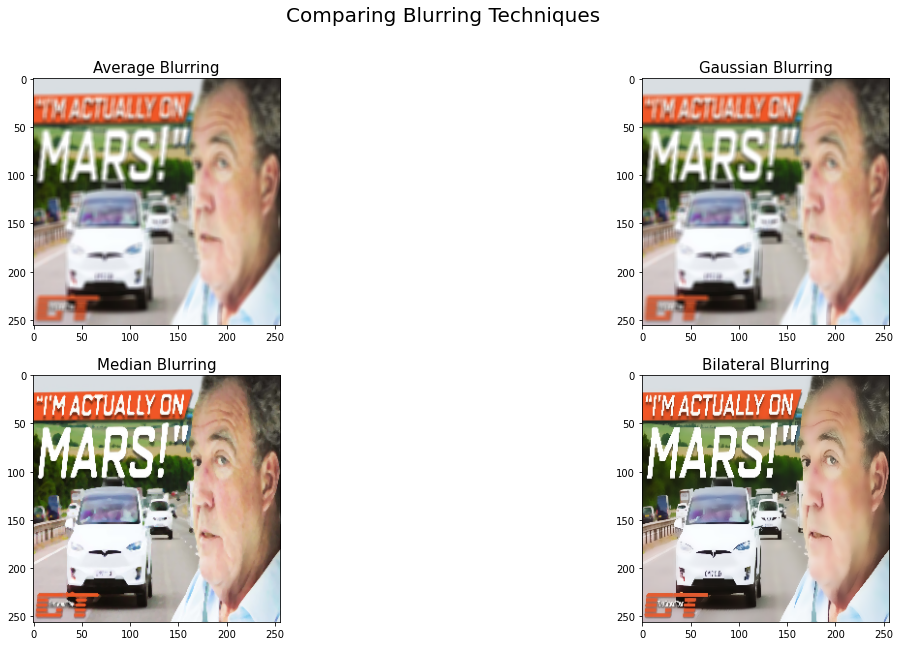

In [191]:
plt.figure(figsize=(20,10))
plt.suptitle("Comparing Blurring Techniques",fontsize=20)
plt.subplot(2, 2, 1)
plt.imshow(cv2.blur(img,ksize=(5,5)))
plt.title("Average Blurring",fontsize='15')

plt.subplot(2, 2, 2)
plt.imshow(cv2.GaussianBlur(img,(5,5),10))
plt.title("Gaussian Blurring",fontsize='15')

plt.subplot(2, 2, 3)
plt.imshow(cv2.medianBlur(img,3))
plt.title("Median Blurring",fontsize='15')

plt.subplot(2, 2, 4)
plt.imshow(cv2.bilateralFilter(img,9,75,75))
plt.title("Bilateral Blurring",fontsize='15')

As shown in the results, Bilateral blurring is abe to remove the noise while keeping the image features such as edges and tips sharp. This would help the model recognize the image features better while at the same time, noises are removed. Median Blurring is also able to reduce salt and pepper noises in the image and it looks quite visible. Hence, I will be testin gout median and bilateral blurring to see which one is the best preprocessing technique

In [98]:
medianBlur_dataset=[]
bilateralBlur_dataset=[]
AverageBlur_dataset=[]
GaussianBlur_dataset=[]
for i in tqdm(range(df.shape[0])):
    img=img_to_array(load_img("data/images/"+str(df['Channel'][i])+"/"+str(df['Filename'][i])+".jpg"))
    img=cv2.resize(img,(256,256))
    AverageBlur_dataset.append(cv2.blur(img,ksize=(5,5)).flatten())
    GaussianBlur_dataset.append(cv2.GaussianBlur(img,(5,5),10).flatten())
    bilateralBlur_dataset.append(cv2.bilateralFilter(img,9,75,75).flatten())
    medianBlur_dataset.append(cv2.medianBlur(img,3).flatten())

medianBlur_X=np.array(medianBlur_dataset)/255
bilateralBlur_X=np.array(bilateralBlur_dataset)/255
AverageBlur_X=np.array(AverageBlur_dataset)/255
GaussianBlur_X=np.array(GaussianBlur_dataset)/255
y=np.array(df[categories])
AverageBlur_X_train,AverageBlur_X_test,AverageBlur_y_train,AverageBlur_y_test=train_test_split(AverageBlur_X,y,random_state=42,test_size=0.2)
GaussianBlur_X_train,GaussianBlur_X_test,GaussianBlur_y_train,GaussianBlur_y_test=train_test_split(GaussianBlur_X,y,random_state=42,test_size=0.2)
medianBlur_X_train,medianBlur_X_test,medianBlur_y_train,medianBlur_y_test=train_test_split(medianBlur_X,y,random_state=42,test_size=0.2)
bilateralBlur_X_train,bilateralBlur_X_test,bilateralBlur_y_train,bilateralBlur_y_test=train_test_split(bilateralBlur_X,y,random_state=42,test_size=0.2)

100%|██████████████████████████████████████████████████████████████████████████████| 1519/1519 [00:15<00:00, 96.85it/s]


In [104]:
def blurring_test(X_train,y_train,X_test,y_test):
    logreg_classifier =MultiOutputClassifier(LogisticRegression())
    logreg_classifier.fit(X_train, y_train)
    predictions = logreg_classifier.predict(X_test)
    predictions = np.argmax(predictions, axis=1)
    y_test=np.argmax(y_test, axis=1)
    return f1_score(y_test, predictions,average='weighted')

In [105]:
print("================ Average Blurring Results ==================")
print("F1 Score:",blurring_test(AverageBlur_X_train,AverageBlur_y_train,AverageBlur_X_test,AverageBlur_y_test))
print("================ Gaussian Blurring Results ==================")
print("F1 Score:",blurring_test(GaussianBlur_X_train,GaussianBlur_y_train,GaussianBlur_X_test,GaussianBlur_y_test))

================ Average Blurring Results ==================
F1 Score: 0.4098512922265477
================ Gaussian Blurring Results ==================
F1 Score: 0.40203971066517574


In [111]:
print("================ Bilateral Blurring Results ==================")
print("F1 Score:",blurring_test(bilateralBlur_X_train,bilateralBlur_y_train,bilateralBlur_X_test,bilateralBlur_y_test))
print("================ Median Blurring Results ==================")
print("F1 Score:",blurring_test(medianBlur_X_train,medianBlur_y_train,medianBlur_X_test,medianBlur_y_test))

================ Median Blurring Results ==================
F1 Score: 0.4520237262092009
================ Bilateral Blurring Results ==================
F1 Score: 0.460531691066945


From the above results, seems like Bilateral blurring gives the a higher f1-score. Hence, will be using bilateral blurring as part of the image processing process

<table width='75%'>
    <thead>
        <td><b><u>Data Preparation Step</u></b></td>
        <td><b><u>f1-score</u></b></td>
        <td><b><u>Include step?</u></b></td>
        <td><b><u>Rationale</u></b></td>
    </thead>
    <tr>
        <td>Resize -(256,256,3)</td>
        <td>0.454</td>
        <td>Yes</td>
        <td>Compulsory otherwise will result in ResourceExhaustError as it requires more computational power & resources</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3) + Gamma Correction</td>
        <td>0.454</td>
        <td>No</td>
        <td>No difference in  model performance and may affect image properties.</td>
    </tr>
    <tr>
        <td style="background-color:#48AAAD;color:white;">Resize -(256,256,3) + Bilateral Blurring</td>
        <td style="background-color:#48AAAD;color:white;">0.461</td>
        <td style="background-color:#48AAAD;color:white;">Yes</td>
        <td style="background-color:#48AAAD;color:white;">Improves the model performance by 1%</td>
    </tr>
</table>
   
 <h3 style="border-style:groove;padding:10px;text-align:centre;border-radius:5px;text-align:center;">C) Conclusion:Optimal Blurring Technique is Bilateral Blurring</h3>

## D) Image Denoising

Next, I will be trying out Image denoising to remove further noises in the data. Denoising of an image refers to the process of reconstruction of a signal from noisy images. Denoising is done to remove unwanted noise from image to analyze it in better form. It refers to one of the major pre-processing steps. There are four functions in opencv which is used for denoising of different images.


Text(0.5, 1.0, 'With Image Denoising')

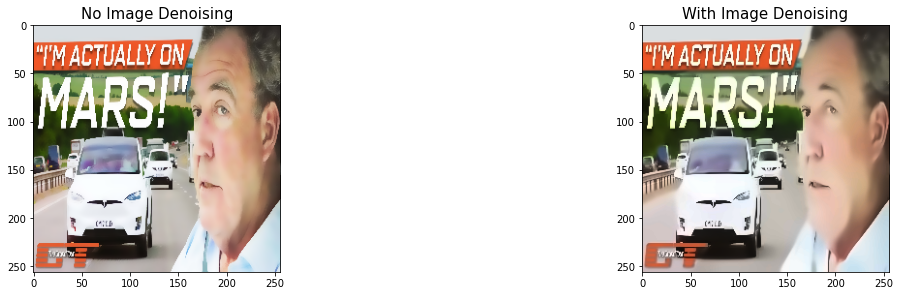

In [204]:
img= cv2.bilateralFilter(img,9,75,75)
plt.figure(figsize=(20,10))

plt.subplot(2, 2, 1)
plt.imshow(img)
plt.title("No Image Denoising",fontsize='15')

plt.subplot(2, 2, 2)
plt.imshow(cv2.fastNlMeansDenoisingColored(img,None,10,10,7,21))
plt.title("With Image Denoising",fontsize='15')

We can see on the right side, the image is slightly blurred due to the denoising function. Now, lets test the model performance of the image with denoising. 

In [125]:
print("================ With Image Denoising====================")
dataset=[]
for i in tqdm(range(df.shape[0])):
    img=np.array(load_img("data/images/"+str(df['Channel'][i])+"/"+str(df['Filename'][i])+".jpg"))
    img=cv2.resize(img,(256,256))
    img=cv2.bilateralFilter(img,9,75,75)
    img=cv2.fastNlMeansDenoisingColored(img,None,10,10,7,21)
    dataset.append(img.flatten())
X=np.array(colored_dataset)/255
y=np.array(df[categories])
X_train,X_test, y_train,y_test=train_test_split(X,y,random_state=42,test_size=0.2)

logreg_classifier =MultiOutputClassifier(LogisticRegression())
logreg_classifier.fit(X_train, y_train)
predictions = logreg_classifier.predict(X_test)
predictions = np.argmax(predictions, axis=1)
y_test=np.argmax(y_test, axis=1)
print("F1 Score:",f1_score(y_test, predictions,average='weighted'))

================ With Image Denoising====================


100%|██████████████████████████████████████████████████████████████████████████████| 1519/1519 [10:13<00:00,  2.47it/s]


F1 Score: 0.4542360658970425


<table width='75%'>
    <thead>
        <td><b><u>Data Preparation Step</u></b></td>
        <td><b><u>f1-score</u></b></td>
        <td><b><u>Include step?</u></b></td>
        <td><b><u>Rationale</u></b></td>
    </thead>
    <tr>
        <td>Resize - (256,256,3)</td>
        <td>0.454</td>
        <td>Yes</td>
        <td>Compulsory otherwise will result in ResourceExhaustError as it requires more computational power & resources</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3) + Gamma Correction</td>
        <td>0.454</td>
        <td>No</td>
        <td>No difference in  model performance and may affect image properties.</td>
    </tr>
    <tr>
        <td style="background-color:#48AAAD;color:white;">Resize -(256,256,3) + Bilateral Blurring</td>
        <td style="background-color:#48AAAD;color:white;">0.461</td>
        <td style="background-color:#48AAAD;color:white;">Yes</td>
        <td style="background-color:#48AAAD;color:white;">Improves the model performance by 0.1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Image Denoising</td>
        <td>0.454</td>
        <td>No</td>
        <td>Model performance decreases by 0.1%</td>
    </tr>
</table>
   
 <h3 style="border-style:groove;padding:10px;text-align:centre;border-radius:5px;text-align:center;">D) Conclusion: Image Denoising is not necessary</h3>

### E) Histogram equalization

After we have removed the noise, I would performing histogram equiziliation to have some contrast adjustment using the image’s histogram.This method usually increases the global contrast of many images, especially when the usable data of the image is represented by close contrast values. Through this adjustment, the intensities can be better distributed on the histogram. This allows for areas of lower local contrast to gain a higher contrast. Histogram equalization accomplishes this by effectively spreading out the most frequent intensity values. The method is useful in images with backgrounds and foregrounds that are both bright or both dark.

However, since cv2 supports only historgram equalization for grayscale images. I have created a function for histogram equzilization for rgb images

In [131]:
def histogram_equalization(img_in):
    # segregate color streams
    b,g,r = cv2.split(img_in)
    h_b, bin_b = np.histogram(b.flatten(), 256, [0, 256])
    h_g, bin_g = np.histogram(g.flatten(), 256, [0, 256])
    h_r, bin_r = np.histogram(r.flatten(), 256, [0, 256])
    # calculate cdf    
    cdf_b = np.cumsum(h_b)  
    cdf_g = np.cumsum(h_g)
    cdf_r = np.cumsum(h_r)
    
    # mask all pixels with value=0 and replace it with mean of the pixel values 
    cdf_m_b = np.ma.masked_equal(cdf_b,0)
    cdf_m_b = (cdf_m_b - cdf_m_b.min())*255/(cdf_m_b.max()-cdf_m_b.min())
    cdf_final_b = np.ma.filled(cdf_m_b,0).astype('uint8')
  
    cdf_m_g = np.ma.masked_equal(cdf_g,0)
    cdf_m_g = (cdf_m_g - cdf_m_g.min())*255/(cdf_m_g.max()-cdf_m_g.min())
    cdf_final_g = np.ma.filled(cdf_m_g,0).astype('uint8')
    cdf_m_r = np.ma.masked_equal(cdf_r,0)
    cdf_m_r = (cdf_m_r - cdf_m_r.min())*255/(cdf_m_r.max()-cdf_m_r.min())
    cdf_final_r = np.ma.filled(cdf_m_r,0).astype('uint8')
    # merge the images in the three channels
    img_b = cdf_final_b[b]
    img_g = cdf_final_g[g]
    img_r = cdf_final_r[r]
  
    img_out = cv2.merge((img_b, img_g, img_r))
    # validation
    equ_b = cv2.equalizeHist(b)
    equ_g = cv2.equalizeHist(g)
    equ_r = cv2.equalizeHist(r)
    equ = cv2.merge((equ_b, equ_g, equ_r))
    #print(equ)
    #cv2.imwrite('output_name.png', equ)
    return img_out

Text(0.5, 1.0, 'With Histogram Equilization')

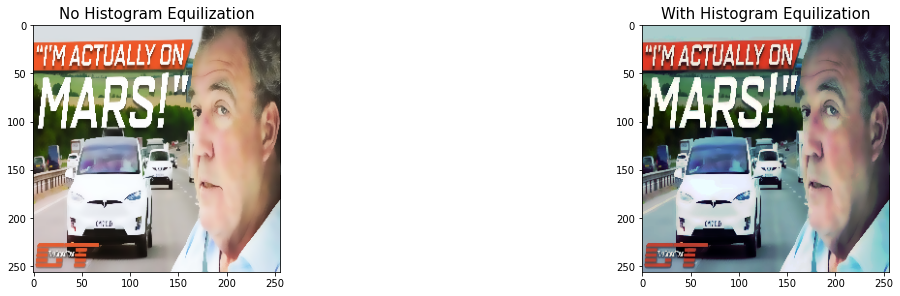

In [166]:
plt.figure(figsize=(20,10))

plt.subplot(2, 2, 1)
plt.imshow(img)
plt.title("No Histogram Equilization",fontsize='15')

plt.subplot(2, 2, 2)
plt.imshow(histogram_equalization(img))
plt.title("With Histogram Equilization",fontsize='15')

With histogram equizilation, we can see that the image contrast is much stronger. Now, lets test the model performance with histogrm equziliation.

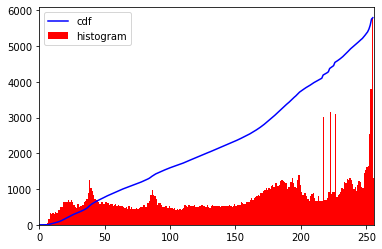

In [141]:
# Histogram with cummulative distribution frequency
hist,bins = np.histogram(img.flatten(),256,[0,256])
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()
plt.plot(cdf_normalized, color = 'b')
plt.hist(img.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

We can see that the image contrast increases after histogram equzilation which is a good sign. Also from the hiistogram the pixel intensity value ranges from 0 to 255 now on the asxis

In [134]:
dataset=[]
for i in tqdm(range(df.shape[0])):
    img=np.array(load_img("data/images/"+str(df['Channel'][i])+"/"+str(df['Filename'][i])+".jpg"))
    img=cv2.resize(img,(256,256))
    img=cv2.bilateralFilter(img,9,75,75)
    dataset.append(histogram_equalization(img).flatten())
X=np.array(colored_dataset)/255
y=np.array(df[categories])
X_train,X_test, y_train,y_test=train_test_split(X,y,random_state=42,test_size=0.2)
print("================ With Histogram Equzilization====================")
logreg_classifier =MultiOutputClassifier(LogisticRegression())
logreg_classifier.fit(X_train, y_train)
predictions = logreg_classifier.predict(X_test)
predictions = np.argmax(predictions, axis=1)
y_test=np.argmax(y_test, axis=1)
print("F1 Score:",f1_score(y_test, predictions,average='weighted'))

100%|██████████████████████████████████████████████████████████████████████████████| 1519/1519 [00:24<00:00, 61.99it/s]


================ With Histogram Equzilization====================
F1 Score: 0.4542360658970425


<table width='75%'>
    <thead>
        <td><b><u>Data Preparation Step</u></b></td>
        <td><b><u>f1-score</u></b></td>
        <td><b><u>Include step?</u></b></td>
        <td><b><u>Rationale</u></b></td>
    </thead>
    <tr>
        <td>Resize - (256,256,3)</td>
        <td>0.454</td>
        <td>Yes</td>
        <td>Compulsory otherwise will result in ResourceExhaustError as it requires more computational power & resources</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3) + Gamma Correction</td>
        <td>0.454</td>
        <td>No</td>
        <td>No difference in  model performance and may affect image properties.</td>
    </tr>
    <tr>
        <td style="background-color:#48AAAD;color:white;">Resize -(256,256,3) + Bilateral Blurring</td>
        <td style="background-color:#48AAAD;color:white;">0.461</td>
        <td style="background-color:#48AAAD;color:white;">Yes</td>
        <td style="background-color:#48AAAD;color:white;">Improves the model performance by 0.1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Image Denoising</td>
        <td>0.454</td>
        <td>No</td>
        <td>Model performance decreases by 0.1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Histogram equalization </td>
        <td>0.454</td>
        <td>No</td>
        <td>Model performance decreases by 0.1%</td>
    </tr>
</table>
   
 <h3 style="border-style:groove;padding:10px;text-align:centre;border-radius:5px;text-align:center;">E) Conclusion: Histogram equalization is not necessary</h3>

### F) Histogram of Oriented Gradients (HOG)

After we have removed the noise, I would performing histogram equiziliation to have some contrast adjustment using the image’s histogram.This method usually increases the global contrast of many images, especially when the usable data of the image is represented by close contrast values. Through this adjustment, the intensities can be better distributed on the histogram. This allows for areas of lower local contrast to gain a higher contrast. Histogram equalization accomplishes this by effectively spreading out the most frequent intensity values. The method is useful in images with backgrounds and foregrounds that are both bright or both dark.

Text(0.5, 1.0, 'With HOG')

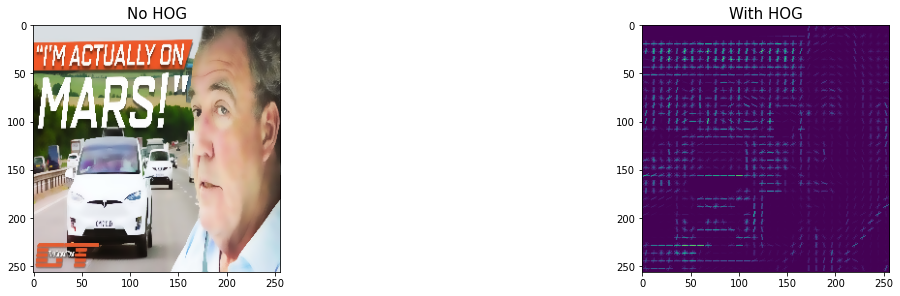

In [167]:
plt.figure(figsize=(20,10))

plt.subplot(2, 2, 1)
plt.imshow(img)
plt.title("No HOG",fontsize='15')

plt.subplot(2, 2, 2)
fd, hog_image = hog(img, orientations=9, pixels_per_cell=(8, 8), 
                    cells_per_block=(2, 2), visualize=True, multichannel=True)
plt.imshow(hog_image)
plt.title("With HOG",fontsize='15')

We can see tha HOG extracts the gradients of the image whereby the edges and structures are clearly extracted and defined.

In [160]:
dataset=[]
for i in tqdm(range(df.shape[0])):
    img=np.array(load_img("data/images/"+str(df['Channel'][i])+"/"+str(df['Filename'][i])+".jpg"))
    img=cv2.resize(img,(256,256))
    img=cv2.bilateralFilter(img,9,75,75)
    
    fd, hog_image = hog(img, orientations=9, pixels_per_cell=(8, 8), 
                    cells_per_block=(2, 2), visualize=True, multichannel=True)
    dataset.append(fd)
X=np.array(colored_dataset)
y=np.array(df[categories])
X_train,X_test, y_train,y_test=train_test_split(X,y,random_state=42,test_size=0.2)
print("================ With HOG====================")
logreg_classifier =MultiOutputClassifier(LogisticRegression())
logreg_classifier.fit(X_train, y_train)
predictions = logreg_classifier.predict(X_test)
predictions = np.argmax(predictions, axis=1)
y_test=np.argmax(y_test, axis=1)
print("F1 Score:",f1_score(y_test, predictions,average='weighted'))

100%|██████████████████████████████████████████████████████████████████████████████| 1519/1519 [02:59<00:00,  8.47it/s]


================ With HOG====================
F1 Score: 0.46005785376001507


We can see that with HOG, it dosent increase the model perfermance, instead it dropped 0.01 from the 3rd version of the preprocessing. Hence, I will not be including this step gievn that it does not help in the prediction

<table width='75%'>
    <thead>
        <td><b><u>Data Preparation Step</u></b></td>
        <td><b><u>f1-score</u></b></td>
        <td><b><u>Include step?</u></b></td>
        <td><b><u>Rationale</u></b></td>
    </thead>
    <tr>
        <td>Resize - (256,256,3)</td>
        <td>0.454</td>
        <td>Yes</td>
        <td>Compulsory otherwise will result in ResourceExhaustError as it requires more computational power & resources</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3) + Gamma Correction</td>
        <td>0.454</td>
        <td>No</td>
        <td>No difference in  model performance and may affect image properties.</td>
    </tr>
    <tr>
        <td style="background-color:#48AAAD;color:white;">Resize -(256,256,3) + Bilateral Blurring</td>
        <td style="background-color:#48AAAD;color:white;">0.461</td>
        <td style="background-color:#48AAAD;color:white;">Yes</td>
        <td style="background-color:#48AAAD;color:white;">Improves the model performance by 0.1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Image Denoising</td>
        <td>0.454</td>
        <td>No</td>
        <td>Model performance decreases by 1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Histogram equalization </td>
        <td>0.454</td>
        <td>No</td>
        <td>Model performance decreases by 1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + HOG </td>
        <td>0.46</td>
        <td>No</td>
        <td>Model performance decreases by 0.01%</td>
    </tr>
</table>
   
 <h3 style="border-style:groove;padding:10px;text-align:centre;border-radius:5px;text-align:center;">F) Conclusion: Histogram of Oriented Gradient is not necessary</h3>

### G) Canny Edge Detection

For this section, I would be using auto canny to detect the edges accurately. 

Text(0.5, 1.0, 'Canny Edge Detection')

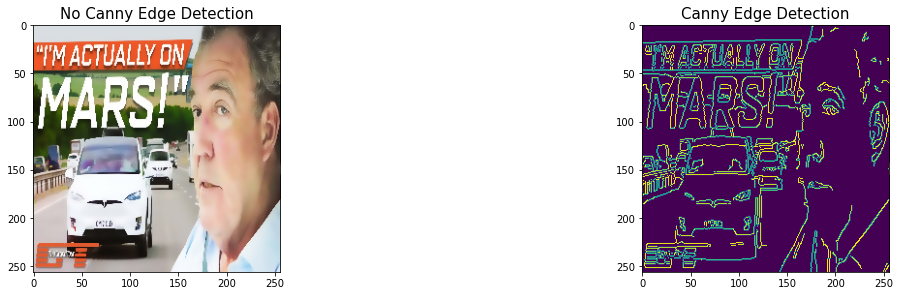

In [172]:
def auto_canny(image, sigma=0.33):
    # compute the median of the single channel pixel intensities
    v = np.median(image)

    # apply automatic Canny edge detection using the computed median
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    edged = cv2.Canny(image, lower, upper)

    # return the edged image
    return edged

plt.figure(figsize=(20,10))

plt.subplot(2, 2, 1)
plt.imshow(img)
plt.title("No Canny Edge Detection",fontsize='15')

plt.subplot(2, 2, 2)
wide = auto_canny(img)
plt.imshow(wide)
plt.title("Canny Edge Detection",fontsize='15')


We can see that the canny edge detector detects the edges present in the images. 

Now, lets the test the performance on the model.

In [174]:
dataset=[]
for i in tqdm(range(df.shape[0])):
    img=np.array(load_img("data/images/"+str(df['Channel'][i])+"/"+str(df['Filename'][i])+".jpg"))
    img=cv2.resize(img,(256,256))
    img=cv2.bilateralFilter(img,9,75,75)
    img=auto_canny(img)
    dataset.append(img.flatten())
X=np.array(colored_dataset)
y=np.array(df[categories])
X_train,X_test, y_train,y_test=train_test_split(X,y,random_state=42,test_size=0.2)
print("================ With Canny Edge Detection ====================")
logreg_classifier =MultiOutputClassifier(LogisticRegression())
logreg_classifier.fit(X_train, y_train)
predictions = logreg_classifier.predict(X_test)
predictions = np.argmax(predictions, axis=1)
y_test=np.argmax(y_test, axis=1)
print("F1 Score:",f1_score(y_test, predictions,average='weighted'))

100%|██████████████████████████████████████████████████████████████████████████████| 1519/1519 [00:21<00:00, 71.59it/s]


================ With Canny Edge Detection ====================
F1 Score: 0.46005785376001507


We can see that with Canny Edge Detection, it dosent increase the model perfermance, instead it dropped 0.01 from the 3rd version of the preprocessing. Hence, I will not be including this step gievn that it does not help in the prediction

<table width='75%'>
    <thead>
        <td><b><u>Data Preparation Step</u></b></td>
        <td><b><u>f1-score</u></b></td>
        <td><b><u>Include step?</u></b></td>
        <td><b><u>Rationale</u></b></td>
    </thead>
    <tr>
        <td>Resize - (256,256,3)</td>
        <td>0.454</td>
        <td>Yes</td>
        <td>Compulsory otherwise will result in ResourceExhaustError as it requires more computational power & resources</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3) + Gamma Correction</td>
        <td>0.454</td>
        <td>No</td>
        <td>No difference in  model performance and may affect image properties.</td>
    </tr>
    <tr>
        <td style="background-color:#48AAAD;color:white;">Resize -(256,256,3) + Bilateral Blurring</td>
        <td style="background-color:#48AAAD;color:white;">0.461</td>
        <td style="background-color:#48AAAD;color:white;">Yes</td>
        <td style="background-color:#48AAAD;color:white;">Improves the model performance by 0.1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Image Denoising</td>
        <td>0.454</td>
        <td>No</td>
        <td>Model performance decreases by 1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Histogram equalization </td>
        <td>0.454</td>
        <td>No</td>
        <td>Model performance decreases by 1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + HOG </td>
        <td>0.46</td>
        <td>No</td>
        <td>Model performance decreases by 0.01%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Canny Edge Detection
        \</td>
        <td>0.46</td>
        <td>No</td>
        <td>Model performance decreases by 0.01%</td>
    </tr>
</table>
   
 <h3 style="border-style:groove;padding:10px;text-align:centre;border-radius:5px;text-align:center;">G) Conclusion: Canny Edge Detection is not necessary</h3>

## H) Converting image to grayscale

As shown, in the analysis, from the overall understanding of all images, we noticed that there were too many different colors shades and tones from different channels, which increases the difficulty and makes it more compelx for the model to take in more image properties. Hence, we would need to convert to gray scale to reduce the dimensionality from 3 channels to 1 channel to reduce the input features that the model receives, thereby decreasing model complexity. However, we will also be looking at the model performance to see if there is any trade off

Text(0.5, 1.0, 'Gray Scale')

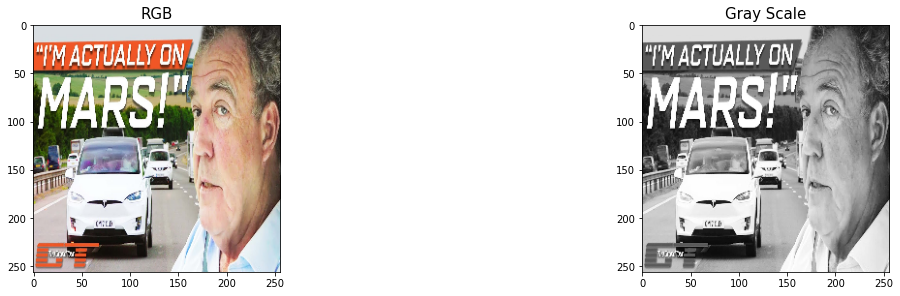

In [193]:
plt.figure(figsize=(20,10))

plt.subplot(2, 2, 1)
plt.imshow(img)
plt.title("RGB",fontsize='15')

plt.subplot(2, 2, 2)
gray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray,cmap='gray')
plt.title("Gray Scale",fontsize='15')


Now, let's test on the grayscaled and colored images on the model and see the performance

In [194]:
## BUILDING GRAYSCALE AND COLORED DATASET
gray_scale_dataset=[]
colored_dataset=[]
image_directory="data/images/"
for i in tqdm(range(df.shape[0])):
    img=load_img(image_directory+str(df['Channel'][i])+"/"+str(df['Filename'][i])+".jpg")
    img=img_to_array(img)  
    img=cv2.resize(img,(256,256))
    colored_dataset.append(img.flatten())
    img=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray_scale_dataset.append(img.flatten())
    
colored_X=np.array(colored_dataset)/255
grayscale_X=np.array(gray_scale_dataset)/255
y=np.array(df[['Category_Food','Category_Tech', 'Category_Entertainment', 'Category_Comedy','Category_News', 'Category_VideoGames']])
colored_X_train,colored_X_test,colored_y_train,colored_y_test=train_test_split(colored_X,y,random_state=42,test_size=0.2)
GS_X_train,GS_X_test,GS_y_train,GS_y_test=train_test_split(grayscale_X,y,random_state=42,test_size=0.2)



100%|██████████████████████████████████████████████████████████████████████████████| 1519/1519 [00:15<00:00, 99.36it/s]


In [196]:
print("=============== COLORED DATA PERFORMANCE ====================")
logreg_classifier =MultiOutputClassifier(LogisticRegression())
logreg_classifier.fit(colored_X_train, colored_y_train)
colored_predictions = logreg_classifier.predict(colored_X_test)
colored_predictions=np.argmax(colored_predictions, axis=1)
colored_y_test=np.argmax(colored_y_test, axis=1)
print("F1 Score:",f1_score(colored_y_test, colored_predictions,average='weighted'))

print("=============== GRAYSCALE DATA PERFORMANCE ====================")
logreg_classifier =MultiOutputClassifier(LogisticRegression())
logreg_classifier.fit(GS_X_train, GS_y_train)
GS_predictions = logreg_classifier.predict(GS_X_test)
GS_predictions=np.argmax(GS_predictions, axis=1)
GS_y_test=np.argmax(GS_y_test, axis=1)
print("F1 Score:",f1_score(GS_y_test, GS_predictions,average='weighted'))

=============== COLORED DATA PERFORMANCE ====================
F1 Score: 0.4542360658970425
=============== GRAYSCALE DATA PERFORMANCE ====================
F1 Score: 0.47310248492032475


From the model results, the gray scale images has improved the model peformance by 2% which is quite alot as compared to the other images preprocessing techniques.

<table width='75%'>
    <thead>
        <td><b><u>Data Preparation Step</u></b></td>
        <td><b><u>f1-score</u></b></td>
        <td><b><u>Include step?</u></b></td>
        <td><b><u>Rationale</u></b></td>
    </thead>
    <tr>
        <td>Resize - (256,256,3)</td>
        <td>0.454</td>
        <td>Yes</td>
        <td>Compulsory otherwise will result in ResourceExhaustError as it requires more computational power & resources</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3) + Gamma Correction</td>
        <td>0.454</td>
        <td>No</td>
        <td>No difference in  model performance and may affect image properties.</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3) + Bilateral Blurring</td>
        <td>0.461</td>
        <td>Yes</td>
        <td>Improves the model performance by 0.1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Image Denoising</td>
        <td>0.454</td>
        <td>No</td>
        <td>Model performance decreases by 1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Histogram equalization </td>
        <td>0.454</td>
        <td>No</td>
        <td>Model performance decreases by 1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + HOG </td>
        <td>0.46</td>
        <td>No</td>
        <td>Model performance decreases by 0.01%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Canny Edge Detection</td>
        <td>0.46</td>
        <td>No</td>
        <td>Model performance decreases by 0.01%</td>
    </tr>
    <tr>
        <td style="background-color:#48AAAD;color:white;">Resize -(256,256,3)  + Bilateral Blurring + Grayscaling</td>
        <td style="background-color:#48AAAD;color:white;">0.47</td>
        <td style="background-color:#48AAAD;color:white;">Yes</td>
        <td style="background-color:#48AAAD;color:white;">Model performance increases by 0.2%</td>
    </tr>
</table>
   
 <h3 style="border-style:groove;padding:10px;text-align:centre;border-radius:5px;text-align:center;">H) Conclusion: Gray Scaling can be included</h3>

## I) Feature Extraction using VGG16 Pre-trained Model

VGG16 is a convolutional neural network trained on a subset of the ImageNet dataset, a collection of over 14 million images belonging to 22,000 categories. VGG 16 is an effective model that helps to do feature extraction before passing it into the model. However, it can only work on RGB images. Hence, I will be converting the image back to RGB

Text(0.5, 1.0, 'No VGG')

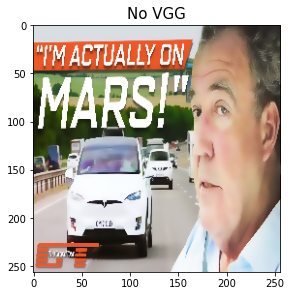

In [205]:
plt.figure(figsize=(20,10))
#img=cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
plt.subplot(2, 2, 1)
plt.imshow(img)
plt.title("No VGG",fontsize='15')


================ With Feature Extraction ===============


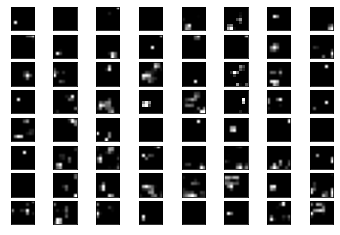

In [209]:
from matplotlib import pyplot
print("================ With Feature Extraction ===============")
x = np.expand_dims(img, axis=0)  
x = preprocess_input(x) 
features = model.predict(x) 

# plot the output from each block
square = 8
for fmap in features:
	# plot all 64 maps in an 8x8 squares
	ix = 1
	for _ in range(square):
		for _ in range(square):
			# specify subplot and turn of axis
			ax = pyplot.subplot(square, square, ix)
			ax.set_xticks([])
			ax.set_yticks([])
			# plot filter channel in grayscale
			pyplot.imshow(features[0, :, :, ix-1], cmap='gray')
			ix += 1
	pyplot.show()

In [211]:
X_dataset=[]
model = VGG16(weights='imagenet', include_top=False)
image_directory="data/images/"
for i in tqdm(range(df.shape[0])):
    img=load_img(image_directory+str(df['Channel'][i])+"/"+str(df['Filename'][i])+".jpg")
    img=img_to_array(img)
    img=cv2.resize(img,(256,256))
    img=np.power
    img = cv2.bilateralFilter(img,9,75,75)
    img = np.expand_dims(img, axis=0)  
    img = preprocess_input(img)
    features = model.predict(img)
    X_dataset.append(features.flatten())
X=np.array(X_dataset)/255
y=np.array(df[['Category_Food','Category_Tech', 'Category_Entertainment', 'Category_Comedy','Category_News', 'Category_VideoGames']])
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=42,test_size=0.2)
print("=============== With VGG Model - Feature Extraction ====================")
logreg_classifier =MultiOutputClassifier(LogisticRegression())
logreg_classifier.fit(X_train, y_train)
predictions = logreg_classifier.predict(X_test)
predictions=np.argmax(predictions, axis=1)
y_test=np.argmax(y_test, axis=1)
print("F1 Score:",f1_score(y_test, predictions,average='weighted'))

100%|██████████████████████████████████████████████████████████████████████████████| 1519/1519 [01:40<00:00, 15.08it/s]


=============== With VGG Model - Feature Extraction ====================
F1 Score: 0.6087966127059268


As shown in the model results, vgg model <b>increases the model performance by 16%!</b> Hence, I will be using VGG16 pre-trained model in the preprocessing step <b>instead of grayscaling as VGG requires the input image to be colored.</b>

<table width='75%'>
    <thead>
        <td><b><u>Data Preparation Step</u></b></td>
        <td><b><u>f1-score</u></b></td>
        <td><b><u>Include step?</u></b></td>
        <td><b><u>Rationale</u></b></td>
    </thead>
    <tr>
        <td>Resize - (256,256,3)</td>
        <td>0.454</td>
        <td>Yes</td>
        <td>Compulsory otherwise will result in ResourceExhaustError as it requires more computational power & resources</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3) + Gamma Correction</td>
        <td>0.454</td>
        <td>No</td>
        <td>No difference in  model performance and may affect image properties.</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3) + Bilateral Blurring</td>
        <td>0.461</td>
        <td>Yes</td>
        <td>Improves the model performance by 0.1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Image Denoising</td>
        <td>0.454</td>
        <td>No</td>
        <td>Model performance decreases by 1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Histogram equalization </td>
        <td>0.454</td>
        <td>No</td>
        <td>Model performance decreases by 1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + HOG </td>
        <td>0.46</td>
        <td>No</td>
        <td>Model performance decreases by 0.01%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Canny Edge Detection</td>
        <td>0.46</td>
        <td>No</td>
        <td>Model performance decreases by 0.01%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Grayscaling</td>
        <td>0.47</td>
        <td>Yes</td>
        <td>Model performance increases by 0.2%</td>
    </tr>
    <tr>
        <td style="background-color:#48AAAD;color:white;">Resize -(256,256,3)  + Bilateral Blurring + VGG Feature Extraction </td>
        <td style="background-color:#48AAAD;color:white;">0.61</td>
        <td style="background-color:#48AAAD;color:white;">Yes</td>
        <td style="background-color:#48AAAD;color:white;">Model performance increases by 16%</td>
    </tr>
</table>
   
 <h3 style="border-style:groove;padding:10px;text-align:centre;border-radius:5px;text-align:center;">I) Conclusion: VGG16 Pre-trained model can be included</h3>

### J) Further Tuning

After further tuning of the last version as mention in section I using brute force and different combiniation, I realised that there was further improvment potential model performance when I added gamma correction of value of 1.1.

In [215]:
from keras.preprocessing.image import load_img, img_to_array

X_dataset=[]
model = VGG16(weights='imagenet', include_top=False)
image_directory="data/images/"
for i in tqdm(range(df.shape[0])):
    img=load_img(image_directory+str(df['Channel'][i])+"/"+str(df['Filename'][i])+".jpg")
    img=img_to_array(img)
    img=cv2.resize(img,(256,256))
    img = np.power(img, 1.1)
    img = cv2.bilateralFilter(img,9,75,75)
    img = np.expand_dims(img, axis=0)  
    img = preprocess_input(img)
    features = model.predict(img)
    X_dataset.append(features.flatten())
X=np.array(X_dataset)/255
y=np.array(df[['Category_Food','Category_Tech', 'Category_Entertainment', 'Category_Comedy','Category_News', 'Category_VideoGames']])
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=42,test_size=0.2)
print("=============== Further Tuning ====================")
logreg_classifier =MultiOutputClassifier(LogisticRegression())
logreg_classifier.fit(X_train, y_train)
predictions = logreg_classifier.predict(X_test)
predictions=np.argmax(predictions, axis=1)
y_test=np.argmax(y_test, axis=1)
print("F1 Score:",f1_score(y_test, predictions,average='weighted'))

100%|██████████████████████████████████████████████████████████████████████████████| 1519/1519 [01:48<00:00, 14.00it/s]


=============== Further Tuning ====================
F1 Score: 0.6232724681092324


<table width='75%'>
    <thead>
        <td><b><u>Data Preparation Step</u></b></td>
        <td><b><u>f1-score</u></b></td>
        <td><b><u>Include step?</u></b></td>
        <td><b><u>Rationale</u></b></td>
    </thead>
    <tr>
        <td>Resize - (256,256,3)</td>
        <td>0.454</td>
        <td>Yes</td>
        <td>Compulsory otherwise will result in ResourceExhaustError as it requires more computational power & resources</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3) + Gamma Correction</td>
        <td>0.454</td>
        <td>No</td>
        <td>No difference in  model performance and may affect image properties.</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3) + Bilateral Blurring</td>
        <td>0.461</td>
        <td>Yes</td>
        <td>Improves the model performance by 0.1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Image Denoising</td>
        <td>0.454</td>
        <td>No</td>
        <td>Model performance decreases by 1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Histogram equalization </td>
        <td>0.454</td>
        <td>No</td>
        <td>Model performance decreases by 1%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + HOG </td>
        <td>0.46</td>
        <td>No</td>
        <td>Model performance decreases by 0.01%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Canny Edge Detection</td>
        <td>0.46</td>
        <td>No</td>
        <td>Model performance decreases by 0.01%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + Grayscaling</td>
        <td>0.47</td>
        <td>Yes</td>
        <td>Model performance increases by 0.2%</td>
    </tr>
    <tr>
        <td>Resize -(256,256,3)  + Bilateral Blurring + VGG Feature Extraction </td>
        <td>0.61</td>
        <td>Yes</td>
        <td>Model performance increases by 16%</td>
    </tr>
    <tr>
        <td style="background-color:#48AAAD;color:white;">Resize -(256,256,3)  + Bilateral Blurring + VGG Feature Extraction + Gamma Correction (value = 1.1)</td>
        <td style="background-color:#48AAAD;color:white;">0.62</td>
        <td style="background-color:#48AAAD;color:white;">Yes</td>
        <td style="background-color:#48AAAD;color:white;">Model performance increases by 17%</td>
    </tr>
</table>
   


<a id='32'><h2> 3.2 Final Data preparation steps [Justified in 3.1]</h2></a>

<b>These are the steps I will be taking:</b>
1. Resizing image to (256,256,3) to Reduce image size, Reduce processing time
2. Gamma Correction to increase brightness (1.1)
3. Bilateral Blurring to remove noise
4.  VGG16 Feature Extraction to extract features

In [189]:
from keras.preprocessing.image import load_img, img_to_array

X_dataset=[]
model = VGG16(weights='imagenet', include_top=False)
image_directory="data/images/"
for i in tqdm(range(df.shape[0])):
    img=load_img(image_directory+str(df['Channel'][i])+"/"+str(df['Filename'][i])+".jpg")
    img=img_to_array(img)
    img=cv2.resize(img,(256,256))
    img = np.power(img, 1.1)
    img = cv2.bilateralFilter(img,9,75,75)
    img = np.expand_dims(img, axis=0)  
    img = preprocess_input(img)
    features = model.predict(img)
    X_dataset.append(features.flatten())


100%|██████████████████████████████████████████████████████████████████████████████| 1519/1519 [01:37<00:00, 15.53it/s]


In [190]:
X=np.array(X_dataset)/255
y=np.array(df[['Category_Food','Category_Tech', 'Category_Entertainment', 'Category_Comedy','Category_News', 'Category_VideoGames']])
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=42,test_size=0.2)
print("X_train shape:",X_train.shape)
print("y_train shape:",y_train.shape)
print()
print("X_test shape:",X_test.shape)
print("y_test shape:",y_test.shape)

X_train shape: (1215, 32768)
y_train shape: (1215, 6)

X_test shape: (304, 32768)
y_test shape: (304, 6)


<a id='4'><h1 style="background-color:#FA8072;border-radius:5px;text-align:center;padding:7px;color:white;"><font color="white">4. Modelling & Evaluation</h1>

As our objective is to  better classify the each thumbnail image according to the vidoe category, I will need to use classification model. 
These are th 4 machine learning models I will be using 
These are the combinations of text representation & classification model:<br>
1. [Model 1: Random Forest Classifier](#41)
2. [Model 2: Logistic Regression](#42)
3. [Model 3: Multinomial Naives Bayes](#43)
3. [Model 4: Support vector Machine](#44)



<b>How will I be going through this process?</b>
1. Try out each combination of text representation + model
2. Fine tune parameters to give the BEST results for each combination
3. Compare the best results of each model (produce a table of original model and fine-tuned model)
4. Derive the model that gives the BEST results out of all models in the [model comparison section](#5)

<b>Metrics:</b><br>
<b>What area of metric will I be focusing on?</b><br>
However, I will be <b>focusing more on f1-score</b> in this project. This is becuase we are not targeting on health related classification or prediction where recall/false negatives are important. Also, our classes are more balanced and we will not need recall to find out the false negatives in each classes. Precision is also not our focus as we are not interested in finding out how well we can predict positive classes. Hence, the most appropriate metrics to be used is the f1-score as it takes into account of both precisionn and recall. 

Also, I will be using weighted f1-score given that the problem is a multilabel classification. Some text can belong to multiple categories and the categories count is imbalanced as mentioned previously.

In [209]:
def plot_CM(classifier,X_train,y_train,X_test,y_test):
    predictions = classifier.predict(X_test)
    predictions=np.argmax(predictions, axis=1)
    y_test=np.argmax(y_test, axis=1)
    accuracy = accuracy_score(y_test, predictions)
    print("Accuracy Score:",  round(accuracy,3))
    print(classification_report(y_test, predictions,target_names=categories))
    cm = confusion_matrix(y_test, predictions)
    fig, ax = plt.subplots()
    sns.heatmap(cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues,cbar=False)
    ax.set(xlabel="Pred", ylabel="True", xticklabels=categories,yticklabels=categories, title="Confusion matrix")
    plt.yticks(rotation=0)
    plt.xticks(rotation=45)


<a id='41'><h2 style="padding:5px;color:white;background-color:#C4E0E5;text-align: center;margin-left:auto;margin-right:auto;border-radius:10px;"><font color="darkblue">4.1 Random Forest Classifier</h2>


First model I will be using random forest classifer as it can handle large datasets efficiently and is known for handling  multiclass classification which in this case we are handling large amount of pixels.  In this assignment, the main target would be predicting multilabelled categories. Hence, I would be using a multiouput classifier which consists of fitting one classifier per target. This is a simple strategy for extending classifiers that do not natively support multi-target classification. It supports the target variables with multiple outputs. Hence, the classifiers used can be either supporting binary or multiclass classification. 

### A: Building Model

First, I will be fitting X_train and y_train into the random forest classifier.

In [193]:
RFC=MultiOutputClassifier(RandomForestClassifier())
RFC.fit(X_train, y_train)

MultiOutputClassifier(estimator=RandomForestClassifier())

### B: Evaluate Model

Accuracy Score: 0.26
                        precision    recall  f1-score   support

         Category_Food       0.19      1.00      0.31        51
         Category_Tech       1.00      0.06      0.11        50
Category_Entertainment       1.00      0.05      0.09        63
       Category_Comedy       0.71      0.13      0.22        39
         Category_News       1.00      0.03      0.05        40
   Category_VideoGames       0.94      0.26      0.41        61

              accuracy                           0.26       304
             macro avg       0.81      0.25      0.20       304
          weighted avg       0.82      0.26      0.21       304



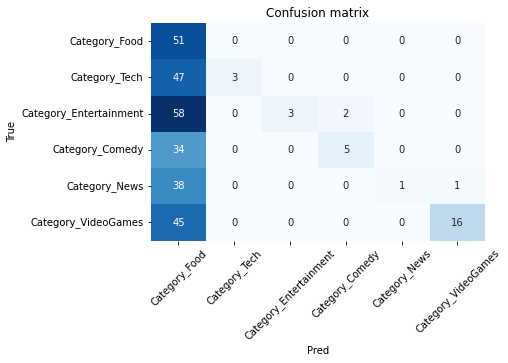

In [213]:
plot_CM(RFC,X_train,y_train,X_test,y_test)

From the results, we can see that the f1-score is very low at 21%. From the confusion matrix, we can also see that for all the categories, most images was wrongly predcited as Food category. Hence there is heavy misclassification. Hence in the next section I will be using Grid Search CV to fine tune the model and improve the results.

### C: Tuning Parameters

<b>How will I be tuning the parameters?</b><br>
** Hyer-parameter tuning: Use Grid SearchCV to find the best combination of parameters that gives highest f1-score

Next, I will be fine-tuning the model using Grid Search CV by fitting in the the paramaters with 2 main paramaters n_estimators and max_features.


In [200]:
RFC=MultiOutputClassifier(RandomForestClassifier(class_weight='balanced'))
params={"estimator__n_estimators":[10, 100, 1000],
    "estimator__max_features":['sqrt', 'log2']}


grid_search = GridSearchCV(estimator=RFC, param_grid=params,scoring='f1_weighted')

In [49]:
grid_search.fit(ml_X_train, y_train)
RFC_best=grid_search.best_estimator_
RFC_best

MultiOutputClassifier(estimator=RandomForestClassifier(class_weight='balanced',
                                                       max_features='log2',
                                                       n_estimators=1000))

Accuracy Score: 0.28
                        precision    recall  f1-score   support

         Category_Food       0.19      0.98      0.32        51
         Category_Tech       1.00      0.12      0.21        50
Category_Entertainment       0.88      0.11      0.20        63
       Category_Comedy       0.62      0.21      0.31        39
         Category_News       0.00      0.00      0.00        40
   Category_VideoGames       1.00      0.23      0.37        61

              accuracy                           0.28       304
             macro avg       0.61      0.27      0.24       304
          weighted avg       0.66      0.28      0.24       304



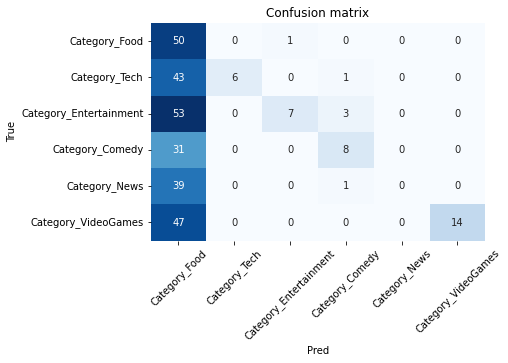

In [211]:
RFC_best.fit(X_train,y_train)
plot_CM(RFC_best,X_train,y_train,X_test,y_test)

After much tuning, we can see that the f1-score increases by 3% only and the problem of misclassification is still existing. Hence, I would not be using this model for the final classification.

### D: Model Insights

<b>After much tuning, let's view the summary of model results:</b>

<table>
    <thead>
        <td>Tuning Methods</td>
        <td>Model information</td>
        <td>Accuracy</td>
        <td>Precision</td>
        <td>Recall</td>
        <td>f1-score</td>
    </thead>
    <tr>
        <td>Original Model</td>
        <td>MultiOutputClassifier(RandomForestClassifier())</td>
        <td>0.26</td>
        <td>0.81</td>
        <td>0.26</td>
        <td>0.21</td>
    </tr>
    <tr>
        <td style="background-color:salmon;color:white;">Grid search CV</td>
        <td style="background-color:salmon;color:white;">MultiOutputClassifier(RandomForestClassifier(n_estimators=1000))</td>
        <td style="background-color:salmon;color:white;">0.28</td>
        <td style="background-color:salmon;color:white;">0.66</td>
        <td style="background-color:salmon;color:white;">0.28</td>
        <td style="background-color:salmon;color:white;">0.24</td>
    </tr>
</table>

From this table we can see that we can use the tuned random forest classifier which is <b>MultiOutputClassifier(RandomForestClassifier(n_estimators=1000))</b> as it <b>gives the higher precision, accuracy, recall and f1-score.

### Conclusion: Highest f1-score of tuned Random Forest Classifier is 24%
   

<a id='42'><h2 style="padding:5px;color:white;background-color:#C4E0E5;text-align: center;margin-left:auto;margin-right:auto;border-radius:10px;"><font color="darkblue">4.2 Logistic Regression</h2>

Second model I will be using logistic regression. Even though logistic regression is known for supporting binary classifcation, in this assignment, the main target would be predicting multilabelled categories. Hence, I would be using a multiouput classifier which consists of fitting one classifier per target. This is a simple strategy for extending classifiers that do not natively support multi-target classification. It supports the target variables with multiple outputs. Hence, the classifiers used can be either supporting binary or multiclass classification. 

I have also chosen logistic regression as Logistic Regression is very easy to understand, requires less training and performs well for simple datasets as well as when the data set is linearly separable. Also, it doesn't make any assumptions about the distributions of classes in feature space.

### A: Building Model

In [54]:
logreg = LogisticRegression()
logreg_classifier =MultiOutputClassifier(logreg)
logreg_classifier.fit(X_train, y_train)

MultiOutputClassifier(estimator=LogisticRegression())

Accuracy Score: 0.599
                        precision    recall  f1-score   support

         Category_Food       0.33      0.94      0.49        51
         Category_Tech       1.00      0.58      0.73        50
Category_Entertainment       0.92      0.57      0.71        63
       Category_Comedy       0.59      0.59      0.59        39
         Category_News       0.82      0.35      0.49        40
   Category_VideoGames       0.91      0.52      0.67        61

              accuracy                           0.60       304
             macro avg       0.76      0.59      0.61       304
          weighted avg       0.78      0.60      0.62       304



(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5]),
 [Text(0, 0.5, 'Category_Food'),
  Text(0, 1.5, 'Category_Tech'),
  Text(0, 2.5, 'Category_Entertainment'),
  Text(0, 3.5, 'Category_Comedy'),
  Text(0, 4.5, 'Category_News'),
  Text(0, 5.5, 'Category_VideoGames')])

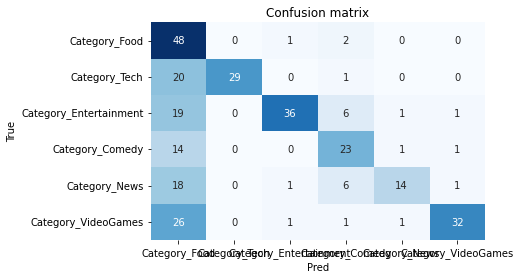

In [55]:
plot_CM(logreg_classifier,X_train,y_train,X_test,y_test)

From the results above, we can see that there is even though TP is higher for each classes as compare to random forest, there are sitll some misclassification for most classes whereby the images are wrongly predicted as Food Category. The f1-score is much higher at 62%.

### C: Tuning Parameters

Next, I will be fine-tuning the model using Grid Search CV by fitting in the the paramaters with 4 parameters class weight, solver, penalty and C

In [174]:
logreg_classifier =MultiOutputClassifier(LogisticRegression())
params={"estimator__class_weight":["balanced"],
        'estimator__solver':['newton-cg', 'lbfgs', 'liblinear'],
        "estimator__penalty":['none',  'l2'],
        "estimator__C":[100, 10, 1.0, 0.1, 0.01]}
grid_search = GridSearchCV(estimator=logreg_classifier, param_grid=params,scoring='f1_weighted')

In [63]:
grid_search.fit(X_train, y_train)
logreg_classifier_best=grid_search.best_estimator_
logreg_classifier_best

MultiOutputClassifier(estimator=LogisticRegression(C=100, penalty='none'))

Accuracy Score: 0.638
                        precision    recall  f1-score   support

         Category_Food       0.40      0.92      0.56        51
         Category_Tech       0.89      0.64      0.74        50
Category_Entertainment       0.95      0.57      0.71        63
       Category_Comedy       0.55      0.67      0.60        39
         Category_News       0.85      0.42      0.57        40
   Category_VideoGames       0.80      0.59      0.68        61

              accuracy                           0.64       304
             macro avg       0.74      0.64      0.64       304
          weighted avg       0.75      0.64      0.65       304



(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5]),
 [Text(0, 0.5, 'Category_Food'),
  Text(0, 1.5, 'Category_Tech'),
  Text(0, 2.5, 'Category_Entertainment'),
  Text(0, 3.5, 'Category_Comedy'),
  Text(0, 4.5, 'Category_News'),
  Text(0, 5.5, 'Category_VideoGames')])

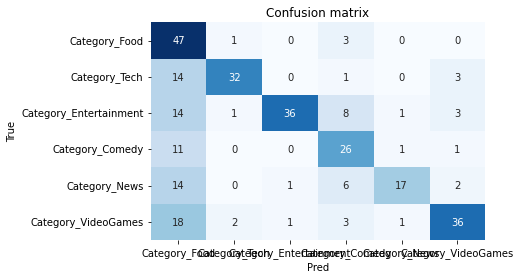

In [61]:
logreg_classifier_best.fit(X_train,y_train)
plot_CM(logreg_classifier_best,X_train,y_train,X_test,y_test)

After some tuning, we see that the f1-score have increased by 4% to 65%. From the confusion matrix, we can see that the True Positive for each category has increased as the shae of the diagonal line is darker than the previous confusion matrix. The number of wrong predictions as food have also decreased alittle from the previous results.

### D: Model Insights

<b>After much tuning, let's view the summary of model results:</b>

<table>
    <thead>
        <td>Tuning Methods</td>
        <td>Model information</td>
        <td>Accuracy</td>
        <td>Precision</td>
        <td>Recall</td>
        <td>f1-score</td>
    </thead>
    <tr>
        <td>Original Model</td>
        <td>MultiOutputClassifier(LogisticRegression())</td>
        <td>0.60</td>
        <td>0.78</td>
        <td>0.60</td>
        <td>0.62</td>
    </tr>
    <tr>
        <td style="background-color:salmon;color:white;">Grid search CV</td>
        <td style="background-color:salmon;color:white;">MultiOutputClassifier           (estimator=LogisticRegression(C=100,penalty="none"))</td>
        <td style="background-color:salmon;color:white;">0.64</td>
        <td style="background-color:salmon;color:white;">0.75</td>
        <td style="background-color:salmon;color:white;">0.64</td>
        <td style="background-color:salmon;color:white;">0.65</td>
    </tr>
</table>

From this table we can see that we can use the tuned naives bayes model which is <b>MultiOutputClassifier (estimator=LogisticRegression(C=100,penalty="none"))	</b> as it <b>gives the higher precision, accuracy, recall and f1-score.

### Conclusion: Highest f1-score of tuned Logistic Regression Classifier is 65%
   

<a id='43'><h2 style="padding:5px;color:white;background-color:#C4E0E5;text-align: center;margin-left:auto;margin-right:auto;border-radius:10px;"><font color="darkblue">4.3 Multinomial Naives Bayes</h2>

Third model I will be using naive bayes  regression. Even though naive bayes suuports both binary and multiclass classification. In this assignment, the main target would be predicting multilabelled categories. Hence, I would be using a multiouput classifier which consists of fitting one classifier per target. This is a simple strategy for extending classifiers that do not natively support multi-target classification. It supports the target variables with multiple outputs. Hence, the classifiers used can be either supporting binary or multiclass classification. 

I have chosen naives bayes as is simple and easy to implement, doesn't require as much training data, highly scalable with the number of predictors and data points.Especially for this  particular dataset where they is only 1500+ rows and a large pixel sizing, it will be more practical to use naives bayes on this dataset.

### A: Building Model -  Multinomial Naives Bayes

In [215]:
from sklearn.naive_bayes import MultinomialNB
MNB_classifier =MultiOutputClassifier(MultinomialNB())
MNB_classifier.fit(X_train, y_train)

MultiOutputClassifier(estimator=MultinomialNB())

### B: Model Evaluation

Accuracy Score: 0.543
                        precision    recall  f1-score   support

         Category_Food       0.46      0.84      0.59        51
         Category_Tech       0.58      0.76      0.66        50
Category_Entertainment       0.60      0.62      0.61        63
       Category_Comedy       0.44      0.41      0.43        39
         Category_News       0.50      0.10      0.17        40
   Category_VideoGames       0.69      0.41      0.52        61

              accuracy                           0.54       304
             macro avg       0.55      0.52      0.50       304
          weighted avg       0.56      0.54      0.51       304



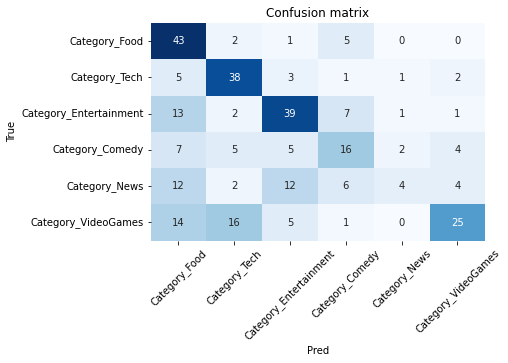

In [216]:
plot_CM(MNB_classifier,X_train,y_train,X_test,y_test)

We can see that for this classifier, the weighted f1-score 51% is not as high as logistic regression but it is still quite decent at 51%. As shown in the confusion matrix, generally most classes have a high number of True Positive except for the news category where the number of TP=4, it has been misclassified wrongly as other categories. Also, for most classes the wrong predictions tend to be that the classifier misclassfy as the food category.

### C: Tuning Parameters

Next, I will be fine-tuning the model using Grid Search CV by fitting in the the paramaters with 2 main paramaters fit prior and alpha

In [68]:
MNB_classifier_best =MultiOutputClassifier(MultinomialNB())

params={"estimator__fit_prior":[True,False],
       'estimator__alpha':[0.0,1.0]}
grid_search = GridSearchCV(estimator=MNB_classifier_best, param_grid=params,scoring='f1_weighted')

In [69]:
grid_search.fit(X_train, y_train)
MNB_classifier_best=grid_search.best_estimator_
MNB_classifier_best

MultiOutputClassifier(estimator=MultinomialNB(alpha=0.0, fit_prior=False))

Accuracy Score: 0.562
                        precision    recall  f1-score   support

         Category_Food       0.42      0.84      0.56        51
         Category_Tech       0.71      0.70      0.71        50
Category_Entertainment       0.66      0.65      0.66        63
       Category_Comedy       0.44      0.46      0.45        39
         Category_News       0.86      0.15      0.26        40
   Category_VideoGames       0.65      0.46      0.54        61

              accuracy                           0.56       304
             macro avg       0.62      0.54      0.53       304
          weighted avg       0.63      0.56      0.55       304



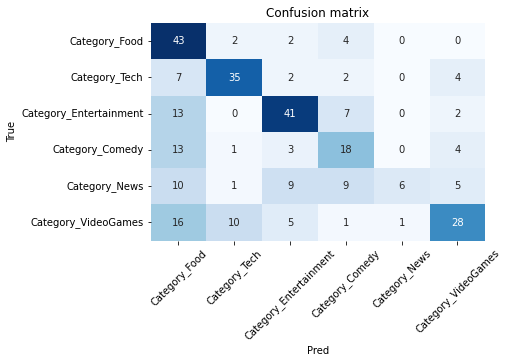

In [219]:
plot_CM(MNB_classifier_best,X_train,y_train,X_test,y_test)

After much tuning , the f1-score have increased to 55%. However, there are still some misclassifcation as shown in the confusion matrix, the number TP for news category have increased but only a little - around 2. In general the f1 score increase is 4% but the misclassification have not been improved as mch yet.

### D: Model Insights

<b>After much tuning, let's view the summary of model results:</b>

<table>
    <thead>
        <td>Tuning Methods</td>
        <td>Model information</td>
        <td>Accuracy</td>
        <td>Precision</td>
        <td>Recall</td>
        <td>f1-score</td>
    </thead>
    <tr>
        <td>Original Model</td>
        <td>MultiOutputClassifier(estimator=MultinomialNB())</td>
        <td>0.562</td>
        <td>0.62</td>
        <td>0.54</td>
        <td>0.53</td>
    </tr>
    <tr>
        <td style="background-color:salmon;color:white;">Grid search CV</td>
        <td style="background-color:salmon;color:white;">MultiOutputClassifier(estimator=MultinomialNB(alpha=0.0, fit_prior=False))</td>
        <td style="background-color:salmon;color:white;">0.56</td>
        <td style="background-color:salmon;color:white;">0.63</td>
        <td style="background-color:salmon;color:white;">0.56</td>
        <td style="background-color:salmon;color:white;">0.55</td>
    </tr>
</table>

From this table we can see that we can use the tuned naives bayes model which is <b>MultiOutputClassifier(estimator=MultinomialNB(alpha=0.0, fit_prior=False))	</b> as it <b>gives the higher precision, accuracy, recall and f1-score.

### Conclusion: Highest f1-score of tuned Multinomial Naives Bayes Classifier is 55%
   

<a id='44'><h2 style="padding:5px;color:white;background-color:#C4E0E5;text-align: center;margin-left:auto;margin-right:auto;border-radius:10px;"><font color="darkblue">4.4 Support Vector Machine</h2>

Third model I will be using is Support Vector Machine. Even though Support Vector Machine is known for supporting binary and multiclass classification. In this assignment, the main target would be predicting multilabelled categories. Hence, I would be using a multiouput classifier which consists of fitting one classifier per target. This is a simple strategy for extending classifiers that do not natively support multi-target classification. It supports the target variables with multiple outputs. Hence, the classifiers used can be either supporting binary or multiclass classification. I have selected SVM as SVM models have generalization in practice, the risk of over-fitting is less in SVM. It also works well with any type of data. 

### A: Building Model -  SVM

In [220]:
from sklearn.svm import LinearSVC
SVM_classifier =MultiOutputClassifier(LinearSVC())
SVM_classifier.fit(X_train, y_train)

MultiOutputClassifier(estimator=LinearSVC())

### B: Model Evaluation

Accuracy Score: 0.612
                        precision    recall  f1-score   support

         Category_Food       0.36      0.90      0.51        51
         Category_Tech       0.94      0.60      0.73        50
Category_Entertainment       0.95      0.59      0.73        63
       Category_Comedy       0.51      0.64      0.57        39
         Category_News       0.79      0.38      0.51        40
   Category_VideoGames       0.92      0.54      0.68        61

              accuracy                           0.61       304
             macro avg       0.74      0.61      0.62       304
          weighted avg       0.76      0.61      0.63       304



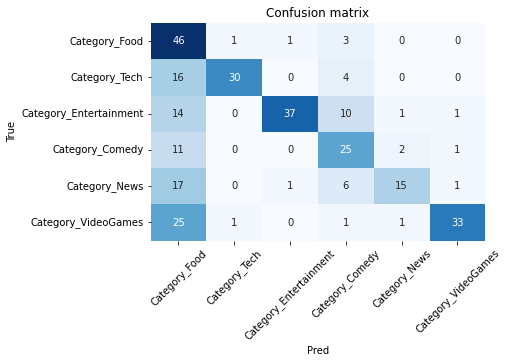

In [221]:
plot_CM(SVM_classifier,X_train,y_train,X_test,y_test)

We can see that for this classifier, the weighted f1-score is not as high as logistic regression but it is still quite decent at 63%. As shown in the confusion matrix, generally most classes have a high number of True Positive except for the news category where the number of True Positive is slightly lower at 15, it has been misclassified wrongly as other caetgories. Also, for most classes the wrong predictions tend to be that the classifier misclassfied as the food category.

### C: Tuning Parameters

Next, I will be fine-tuning the model using Grid Search CV by fitting in the the paramaters with 2 main paramaters C and dual


In [76]:
SVM_classifier_best =MultiOutputClassifier(LinearSVC())

params={'estimator__C': [1,2,3,4,5,6,7,8,9],
        'estimator__dual': [True,False]}
grid_search = GridSearchCV(estimator=SVM_classifier_best, param_grid=params,scoring='f1_weighted')

In [87]:
grid_search.fit(X_train, y_train)
SVM_classifier_best=grid_search.best_estimator_
SVM_classifier_best

MultiOutputClassifier(estimator=LinearSVC(C=9, dual=False))

Accuracy Score: 0.618
                        precision    recall  f1-score   support

         Category_Food       0.37      0.92      0.53        51
         Category_Tech       0.91      0.62      0.74        50
Category_Entertainment       0.92      0.57      0.71        63
       Category_Comedy       0.51      0.62      0.56        39
         Category_News       0.81      0.42      0.56        40
   Category_VideoGames       0.92      0.54      0.68        61

              accuracy                           0.62       304
             macro avg       0.74      0.62      0.63       304
          weighted avg       0.76      0.62      0.64       304



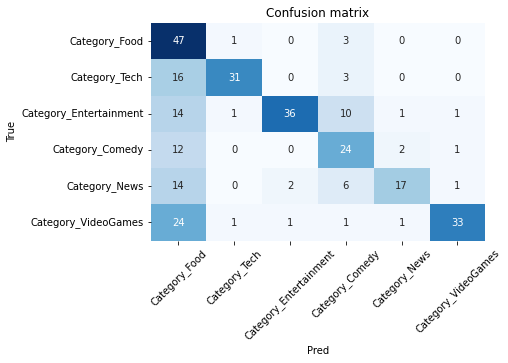

In [223]:
SVM_classifier_best.fit(X_train,y_train)
plot_CM(SVM_classifier_best,X_train,y_train,X_test,y_test)

After much tuning , the f1-score have increased to 64%. However, there are still some misclassifcation as shown in the confusion matrix, the number TP for each category have increased but only a little - around 1 to 2. In general the f1 score increase 1% but the misclassification have not been improved as much yet. Also the misclassification of the categories as food is still exisiting.

### D: Model Insights

<b>After much tuning, let's view the summary of model results:</b>

<table>
    <thead>
        <td>Tuning Methods</td>
        <td>Model information</td>
        <td>Accuracy</td>
        <td>Precision</td>
        <td>Recall</td>
        <td>f1-score</td>
    </thead>
    <tr>
        <td>Original Model</td>
        <td>MultiOutputClassifier(LinearSVC())</td>
        <td>0.61</td>
        <td>0.76</td>
        <td>0.61</td>
        <td>0.63</td>
    </tr>
    <tr>
        <td style="background-color:salmon;color:white;">Grid search CV</td>
        <td style="background-color:salmon;color:white;">MultiOutputClassifier(LinearSVC(C=9,dual=False))</td>
        <td style="background-color:salmon;color:white;">0.62</td>
        <td style="background-color:salmon;color:white;">0.74</td>
        <td style="background-color:salmon;color:white;">0.62</td>
        <td style="background-color:salmon;color:white;">0.64</td>
    </tr>
</table>

From this table we can see that we can use the tuned naives bayes model which is <b>MultiOutputClassifier(estimator=MultinomialNB(alpha=0.0, fit_prior=False))	</b> as it <b>gives the higher precision, accuracy, recall and f1-score.

### Conclusion: Highest f1-score of tuned Multinomial Naives Bayes Classifier is 64%
   

<a id='5'><h2 style="padding:10px;color:white;background-color:salmon;text-align: center;margin-left:auto;margin-right:auto;border-radius:5px;"><font color="white">5. Overall Comparison of Results </h2>

<b>Let's compare the summary of all model results:</b>

<table>
    <thead>
        <td>Fine- Tuned model of algorithms</td>
        <td>Model information</td>
        <td>Accuracy</td>
        <td>Precision</td>
        <td>Recall</td>
        <td>f1-score</td>
    </thead>
    <tr>
        <td>Random Forest Classifier</td>
        <td>MultiOutputClassifier(RandomForestClassifier(n_estimators=1000))</td>
        <td>0.27</td>
        <td>0.65</td>
        <td>0.27</td>
        <td>0.23</td>
    </tr>
    <tr>
        <td style="background-color:salmon;color:white;">Logistic Regression</td>
            <td style="background-color:salmon;color:white;">MultiOutputClassifier           (estimator=LogisticRegression(C=100,penalty="none"))</td>
        <td style="background-color:salmon;color:white;">0.64</td>
        <td style="background-color:salmon;color:white;">0.75</td>
        <td style="background-color:salmon;color:white;">0.64</td>
        <td style="background-color:salmon;color:white;">0.65</td>
    </tr>
    <tr>
        <td>Multinomial Naive Bayes</td>
        <td>MultiOutputClassifier(estimator=MultinomialNB(alpha=0.0, fit_prior=False))</td>
        <td>0.56</td>
        <td>0.63</td>
        <td>0.56</td>
        <td>0.55</td>
    </tr>
    <tr>
        <td>SVM</td>
        <td >MultiOutputClassifier(LinearSVC(C=9,dual=False))</td>
        <td >0.62</td>
        <td >0.74</td>
        <td >0.62</td>
        <td >0.64</td>
    </tr>
</table>

In general the model perfomances across all models is not ideal as none of the models have reached f1-score above 70%. I will be choosing the best perfoming model which is logistic regression which has the highest F1-score of 65% which would mean that the False positive and False negatives are kept lower with lesser misclassification.

<b>Conclusion for machine learning models:<br></b> The best combination is the Tuned  Logistic Regression with the parameters of: <b><i>MultiOutputClassifier (estimator=LogisticRegression(C=100,penalty="none"))</i></b> 
where it gives the <b>highest f1-score of 65% and overall results where accuracy is highest at 64%,  precision at 75% and recall is at 64%.</b>


<a id='6'><h2 style="padding:10px;color:white;background-color:salmon;text-align: center;margin-left:auto;margin-right:auto;border-radius:5px;"><font color="white">6. Comparison  of prediction from task 1 & task 2 </h2>

### As mentioned in the project guide as the anaysis aims to be the accompaniment of modelling results for Task 1: Text Classification & Task 2: Image Classification,  I will be analysing and comparing the BEST Fined-Tuned Model from each task.

<b>Best Model From Task 1 and Task 2 </b>

<table>
    <thead>
        <td>Task</td>
        <td>Model</td>
        <td>Model information</td>
        <td>Accuracy</td>
        <td>Precision</td>
        <td>Recall</td>
        <td>f1-score</td>
    </thead>
    <tr>
        <td>Task 1</td>
        <td>Tf-idf  + Logistic Regression</td>
        <td>Pipeline([('vect', TfidfVectorizer(max_df=0.8, max_features=10000, ngram_range=(1,2)),('clf', MultiOutputClassifier(LogisticRegression(class_weight='balanced', max_iter=3000)))])</td>
        <td>0.83</td>
        <td>0.94</td>
        <td>0.88</td>
        <td>0.91</td>
    </tr>
    <tr>
        <td>Task 2</td>
        <td>Logistic Regression</td>
        <td>MultiOutputClassifier(estimator=LogisticRegression(C=100,penalty="none"))</td>
        <td>0.64</td>
        <td>0.75</td>
        <td>0.64</td>
        <td>0.65</td>
    </tr>
</table>

#### Insights and Analysis:
From the above table we can see that the text classification has a higher overall performance as compared to the model in task 2. Model-wise, both best models from each task is Logistic Regression. As the model used is the same, it would mean the algorithm used for the classification/prediction of the video categories is the same. Hence, the only difference would be the data. We can infer that the images data may either be of bad quality or the quantity trainign and testing set is not enough to train the model. On the other hand, textual data may be easier to predict. Hence, my recommendation for this problem would be 
- EITHER  to <b>Focus more on the video transcript and title instead of thumbnail when building the recommender systems</b> 
- OR to <b>Acquire mode dataset for thumbnail images such that the model can be trained thoroughly and well enough to improve the model performance.</b> 

If more data is managed to be acquired, an ensemble cann then be built to get the predictions from the 2 goo performing models and aggregate the results from both sides. Otherwise, with the model perfomance of the image classification model, it will be hard to do ensemble modeelling with text classification data given that it may affect the final results of the predictions.

<a id='7'><h2 style="padding:10px;color:white;background-color:salmon;text-align: center;margin-left:auto;margin-right:auto;border-radius:5px;"><font color="white">7. Conclusion </h2>

For this image classification report, I have gone through the whole data pipeline from data understanding, preparation, exploratory data analysis, modelling, evaluation, prediction and finally comparison of models. To optimize the performance of the model, I have tried many methodologies and switched the order of the data preparations and modelling preparation steps especially for image processing. The insights derived from a wide variety of models also contributed greatly to the overall objective, which is to classify video category based on the thumbnail image data. It is evident that different image processing steps and different models with different parameters can indeed affect model performance. Additionally, the more models tested, the higher probability of finding a good model for our predictions. I hope this report will provide great value to you and assist you to find the best model that will derive the most accurate and precise predictions in predicting the video category based on thumbnail image. Thank you.